<a href="https://colab.research.google.com/github/kevinroccapriore/Predictability/blob/main/AE_EELS_plasmonics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

May 13, 2020

Sergei V. Kalinin

Here, based on the EELS data on particles, we aim to implement the im2spec and spec2im translation. This is an intermediate step between GP and DNN analytics in spectral domain, and predictability of the EELS spectra to be implemented via descriptor vector. 




# Predictability of localized plasmonic responses in nanoparticle assemblies
2.21.20

Notebook created by Kevin Roccapriore with Jordan Hachtel & Maxim Ziatdinov. 

This is a collection of analytical tools designed to compress the features (both in space and energy) of plasmon resonances into a latent feature space, representing the most significant latent variables. Once the latent space can be extracted, we use autoencoder scheme to learn and hence predict the EEL spectra given a geometric arrangement of particles (*im2spec* network) and vice versa (*spec2im* network)

The following data was collected by Kevin Roccapriore and Jordan Hachtel using the monochromated abberation corrected scanning transmission electron microscope (MACSTEM)

In [ ]:
#@title Dependencies

import numpy as np
import pandas as pd
import json
from pylab import cm
from scipy import interpolate
from sklearn.decomposition import NMF
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
from scipy.optimize import curve_fit
from scipy import ndimage
import operator
from scipy import signal
import matplotlib
from matplotlib.widgets import Slider, Button, RadioButtons
from mpl_toolkits import mplot3d

In [ ]:
#@title Function definitions
def TruncateColormap(cmap = 'jet', lowerlim = 0, upperlim = 1, N=100):
    '''Cuts the upper/lower bound limits of a previously specified color map. 
    For example, user wishes to display half the jet cmap- from red to green,
    instead of from red to blue. 
    Inputs: 
        cmap: the color map to truncate
        lowerlim and upperlim: from scale from 0 to 1. lowerlim=0 and upperlim=1
        would return the identical cmap
        N number of steps
    '''
    gotcmap = plt.get_cmap(cmap)
    truncatedcolormap = LinearSegmentedColormap.from_list('list', gotcmap(np.linspace(lowerlim, upperlim, 100)),N=100)
    return truncatedcolormap

def OrganizeInput(numpy):
    SIraw = np.load(numpy)
    XY = SIraw.shape[:2]
    SIj = json.load(open(numpy[:-3]+'json','r'))
    disp = SIj['spatial_calibrations'][2]['scale']
    SIraw_flat=SIraw.reshape((np.prod(XY),SIraw.shape[2]))
    return SIraw, XY, disp, SIraw_flat
    
def LoadADF(filename):
    ADF1    = np.load(filename)
    ADF1j = json.load(open(filename[:-3]+'json','r'))
    ADF1_scale = ADF1j['spatial_calibrations'][0]['scale']
    return ADF1, ADF1_scale

def BlurSpectra_single(SIraw, sigma = 10):
    SIraw_blur_single = ndimage.filters.gaussian_filter(SIraw, sigma = sigma)
    return SIraw_blur_single

def BlurSpectra(SIraw, sigma = 10):
    SIraw_blur = np.zeros((SIraw.shape[0],SIraw.shape[1],SIraw.shape[2]))
    for i in range(SIraw.shape[0]):
        for j in range(SIraw.shape[1]):
            SIraw_blur[i,j] = ndimage.filters.gaussian_filter(SIraw[i,j,:], sigma = sigma)
    return SIraw_blur

def BlurSpectra_flat(SI, sigma = 10):
    SI_blur = np.zeros_like(SI)
    for ii in range(SI_blur.shape[0]):
        SI_blur[ii] = ndimage.filters.gaussian_filter(SI[i,:], sigma = sigma)
    return SI_blur

def CorrectNeg(SIraw, Blur = 10, Neg = -20, Pixrange = 250):
    """
    Args:
       SI = Accepts any 3-dim SI as the operated-on SI, normally raw
       Blur =   gaussian blur sigma value. Should be set 10-30
                range to avoid false peaks due to noise
       Neg =    value which is considered to be negative. 
                Generally shouldn't be set to exactly 0 (or very close,
                like -1), due to noise effects
                **this also prevents spectra which are not negative at
                all from being artificially offset**
       Pixrange = number of pixels to average (centered around most 
                negative pixel located after blurring) over for sub-
                tracting from raw data
    Returns:
       - Original SI with offset
       - Blurred SI with offset
       - Plot of original + blurred offset 
    """  
    # blurs each pixels' spectrum
    SIraw_blur = np.zeros((SIraw.shape[0],SIraw.shape[1],SIraw.shape[2]))
    for i in range(SIraw.shape[0]):
        for j in range(SIraw.shape[1]):
            SIraw_blur[i,j] = ndimage.filters.gaussian_filter(SIraw[i,j,:], sigma = Blur)
    
    # local min peak search:
    # performs scipy findpeaks function (inverts signal to find MIN), then picks out most negative
    # again, should be OK due to the blurring previously
    # Derp, I think this could've been done much easier with np.min() and np.argmin()...
    # Actually maybe not, because I set a height parameter with findpeaks.
    
    MN = np.zeros((SIraw.shape[0],SIraw.shape[1]))
    posmaxpixel = np.zeros((SIraw.shape[0],SIraw.shape[1]))     
    for i in range(SIraw_blur.shape[0]):
        for j in range(SIraw_blur.shape[1]):
            if np.amax(SIraw[i,j])<5000:
                MN[i,j] = np.nan
            else:
                posmaxpixel[i,j]= np.argmax(SIraw_blur[i,j,:])
        
                peaks,props = signal.find_peaks(-1*SIraw_blur[i,j,int(posmaxpixel[i,j]):],height = -20)
                keys = peaks.tolist()
                values = props['peak_heights'].tolist()
                peakdict = dict(zip(keys, values))     
                sorted_peakdict = sorted(peakdict.items(), key=operator.itemgetter(1))
                mostneg = np.array(sorted_peakdict[-1:])
                mostnegT = mostneg.T
                try:
                    MN[i,j] = posmaxpixel[i,j]+mostnegT[0][0] # this is the most negative pixel, value that we need   
                except IndexError:
                    MN[i,j] = np.nan # if sample TOO THICK, spectrum is noise, so will produce index error; 
                                     # this just gives that the bird by setting to NaN.

      
            
    SInc =  np.zeros_like(SIraw)      
    SInegmean = np.zeros((SIraw.shape[0],SIraw.shape[1]))        
    for i in range(SIraw_blur.shape[0]):
         for j in range(SIraw_blur.shape[1]):
            if np.isnan(MN[i,j]) == True:     # handling if sample too thick
                SInc[i,j] = SIraw[i,j]
            elif np.isnan(MN[i,j]) == False:
                SInegmean[i,j] = np.mean(SIraw_blur[i,j,int(MN[i,j]-Pixrange/2):int(MN[i,j]+Pixrange/2)])
                SInc[i,j] = SIraw[i,j] - SInegmean[i,j]
            
                
            
    # for plotting (finding scatter XY coordinates)
    x_pos, y_pos = np.zeros_like(MN), np.zeros_like(MN)
    for i in range(SIraw_blur.shape[0]):
        for j in range(SIraw_blur.shape[1]):
            if np.isnan(MN[i,j]) == True:
                x_pos[i,j] = 0
                y_pos[i,j] = 0
            else:
                x_pos[i,j] = int(MN[i,j])
                y_pos[i,j] = SIraw_blur[i,j,int(x_pos[i,j])]
    
    i,j = np.random.randint(SIraw.shape[0]), np.random.randint(SIraw.shape[1])
                                                                           
    fig = plt.figure(figsize=(16,4))
    gs = gridspec.GridSpec(1,2)
    ax1 = plt.subplot(gs[0,0])
    ax2 = plt.subplot(gs[0,1])
    
    ax1.plot(SIraw_blur[i,j,:])
    ax1.plot(SIraw[i,j], alpha = 0.5)
    ax1.set_ylim(-100,1000)
    ax1.axhline(0,color='k',ls='--',lw=1.5)
    
    if x_pos[i,j] == 0:
        ax1.annotate('No offset performed: \nCould not find negative enough value', xy = (0.5,0.7), xycoords = 'axes fraction')
    else:
        ax1.scatter(x_pos[i,j], y_pos[i,j], color = 'r')
        patch1 = patches.Rectangle((x_pos[i,j]-Pixrange/2, y_pos[i,j]-30), Pixrange, 60, linewidth = 1, edgecolor = 'red', facecolor = 'red', fill = False)
        ax1.add_patch(patch1)
    
    
    ax2.plot(SInc[i,j])
    ax2.set_ylim(-100,1000)
    ax2.axhline(0,color='k',ls='--',lw=1.5);
    
    # r'$\bf{fixed \ data}$
    
    ax1.set_title(r'$\bf{XY} = $' + r'$\bf[{},{}]$: Raw SI, blurred SI, region of averaging'.format(i,j))
    ax2.set_title(r'$\bf{XY} = $' + r'$\bf[{},{}]$: Corrected SI'.format(i,j))
    
    return SInc

def CalibrateEnergyAxis(SI,disp,style='fwhm',subfitwidth=8):
    Einit=np.arange(0,SI.shape[2])*disp
    if style=='pixel': ZLPC=np.array([[Einit[np.argmax(s)] for s in row] for row in SI])
    if style=='fwhm':
        lh,uh=[],[]
        avspec=np.average(SI,axis=(0,1))
        for row in SI:
            lh.append([]);uh.append([])
            for s in row:
                if np.amax(s)<1000: # This line is for thick samples when ZLP drops to noise levels
                    s=avspec
                lh[-1].append(Einit[np.argmin(np.abs(s[:np.argmax(s)]/np.amax(s)-0.5))])
                uh[-1].append(Einit[np.argmin(np.abs(s[np.argmax(s):]/np.amax(s)-0.5))+np.argmax(s)])
        lh=np.asarray(lh)        
        uh=np.asarray(uh)
        ZLPC=np.average([uh,lh],axis=0)
    if style=='subpixel':
        def gauss(x,a,x0,s): return a*np.exp(-(x-x0)**2/s**2)
        from scipy.optimize import curve_fit
        ZLPC=np.array([[curve_fit(gauss,Einit[np.argmax(s)-W:np.argmax(s)+W],
                               s[np.argmax(s)-W:np.argmax(s)+W]/np.amax(s))[0][1] for s in row] for row in SI])
    return np.array([[Einit-c for c in row] for row in ZLPC])
    
def CalibrateSI(EAx,SI,N=5000):
    m,M = np.amax(np.amin(EAx,axis=(2))), np.amin(np.amax(EAx,axis=(2)))
    Eout=np.linspace(m,M,N)[1:]
    Eout=np.linspace(m,M,N,endpoint=True)
    SIout=np.array([[interpolate.interp1d(e,s)(Eout) for e,s in zip(erow,srow)] for erow,srow in zip(EAx,SI)])
    return Eout,SIout
  
def FitPowerlaw(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E,S,color='k',label='Data')
    plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[ist+1],E[ien-1],1000)
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    plt.ylim(0,0.002)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[ist:],S[ist:],color='k',label='Data')
    plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
    plt.axhline(0,color='k')
    plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    plt.ylim(-0.0001,0.001)
    return fite,0.#,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d)
  
def FitPowerlaw2R(E,S,fs1,fe1,fs2,fe2):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E*1000,S,color='k',label='Data')
    plt.plot(e*1000,s,marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[is1+1],E[ie2-1],300)
    f=interpolate.interp1d(E[is1:ie2],S[is1:ie2],kind='linear')
    nozeros=s[np.where(s>0)]
    nozeroe=e[np.where(s>0)]
    elog=np.log(nozeroe)
    slog=np.log(nozeros)
    plt.ylim(0,0.02)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[is1:]*1000,S[is1:],color='k',label='Data')
    plt.plot(E[is1:]*1000,np.exp(A0)*E[is1:]**(r),'b',label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
   # plt.plot(fite,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d),color='r',label='Exponential Subtraction')
    plt.plot(E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.axhline(0,color='k')
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    
    plt.ylim(-0.0001,0.001)
    
    return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)


## background subtraction using either 1 region or 2 regions:

def RemoveBackgroundSI(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    if len(np.where(S[ist:ien]>0)[0]) == 0.: 
        plt.plot(E[ist:],S[ist:])
        return E[ist:],np.zeros(E[ist:].shape)
    r,A0=np.polyfit(elog,slog,1)
    return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),
  
def RemoveBackgroundSI2R(E,S,fs1,fe1,fs2,fe2):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    elog=np.log(e[np.where(s>0)])
    slog=np.log(s[np.where(s>0)])
    r,A0=np.polyfit(elog,slog,1)
    return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)

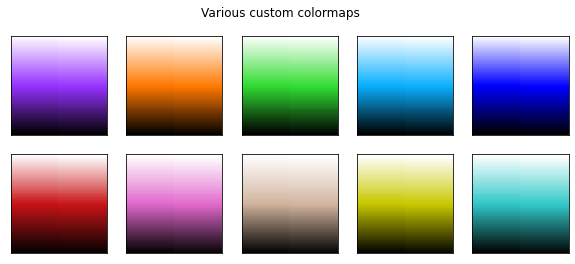

In [ ]:
#@title Color mapping
from matplotlib.colors import LinearSegmentedColormap

data1 = np.linspace(0, 1, 2500).reshape((50, 50))

bPw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (150./255,50/255., 1.),(1,1,1)], N=100)
bOw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (1,120./255, 0),(1,1,1)], N=100)
bGw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (50./255,220./255, 50./255),(1,1,1)], N=100)
bBw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (10./255,175/255., 1.),(1,1,1)], N=100)
bDBw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (0/255,0./255, 255/255),(1,1,1)], N=100)
bRw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (200./255,20/255., 20/225.),(1,1,1)], N=100)
bPiw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (225./255,105/255., 180/225.),(1,1,1)], N=100)
bBrw= LinearSegmentedColormap.from_list('list', [(0, 0, 0), (210./255,180/255., 140/225.),(1,1,1)], N=100)
bYw= LinearSegmentedColormap.from_list('list', [(0, 0, 0), (200./255,200/255., 0/225.),(1,1,1)], N=100)
bLGw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (50./255, 200/255, 200/255),(1,1,1)], N=100)

cmaps = [bPw,bOw,bGw,bBw,bDBw,bRw,bPiw,bBrw,bYw,bLGw]

rows = int(np.ceil(float(len(cmaps))/5))
cols = int(np.ceil(float(len(cmaps))/rows))
gs1 = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (2*cols, 2*(1+rows//2)))
fig.suptitle('Various custom colormaps')
for i in range(len(cmaps)):
    ax1 = fig.add_subplot(gs1[i])
    ax1.pcolormesh(data1,cmap=cmaps.pop(0))
    plt.setp([ax1], xticks = [], yticks =[])

### Import files:
* Assumes input in the form of numpy array (and metadata from json file)
    * npy file contains hyperspectral data
    * json file contains dispersion information (to calibrate energy axis)

__Note__: _users of Nion Swift will export numpy and json files_
* To do:  add more general input of data

## download files

In [ ]:
#@title File downloads...
%%capture
# Array 1  (HAADF + hyperspectral npy and json files)
# "large-ish" hole in FITO 10
!gdown https://drive.google.com/uc?id=17blwsdzDxjlL1rtoxcNTvIV6v_PVIILm # ADF npy
!gdown https://drive.google.com/uc?id=13MrY8xXQsDfa-Tym_ScBXoZNI72rhDGP # ADF json
!gdown https://drive.google.com/uc?id=1XlAOV7zghv9oVVk4p1ABcjaFAn06EMR3 # SI npy
!gdown https://drive.google.com/uc?id=1T7_vY5IbhEYAGaDBA1o4oF8UcBH0MEvc # SI json


# Array 2  (HAADF + hyperspectral npy and json files)
# FITO 10 710
!gdown  https://drive.google.com/uc?id=1K2rGlkMu6dQhcHPhJ6pJliG-_smkrLkx # SI npy
!gdown  https://drive.google.com/uc?id=11yOv9PPpfQGi7cSjBDkMu_VKp0V_GAZ4 # SI json
!gdown  https://drive.google.com/uc?id=1jxypNd2Nc1qdzPG3QyIj6bvF0K3g7xH_ # ADF npy
!gdown  https://drive.google.com/uc?id=1rcNqID-9bNkBexlxZ6wCIn-t7A-4NPSN # ADF json

# Array 3
# single hole & edge (actually FITO 0 not FITO 10)
!gdown https://drive.google.com/uc?id=13YBeDuuQfQ4P6-fEJR7ZJRrgLDqde66e
!gdown https://drive.google.com/uc?id=1MhBR_F1F9bL47d1voyC--sbxqv59MlIv
!gdown https://drive.google.com/uc?id=1HbJdYhbxllM26E6ObKKj1uA-YgYYE61c
!gdown https://drive.google.com/uc?id=1cNsdbOsBMUM0QWR8VJkkfPoTA5jRGZD4

# Array 4
# ~4x4
!gdown https://drive.google.com/uc?id=1PwLZ2EKzwR5t0PynghTwu_rveRqwvJ_U
!gdown https://drive.google.com/uc?id=1DAnRuhxkSuz-a0j7enQzVLNaave3TE9V
!gdown https://drive.google.com/uc?id=12JIxNBHdxAYYnWBv5mOuLiya7dPIozVw
!gdown https://drive.google.com/uc?id=1LI18-kqZEXaOryKHZhnDvzoyw1goPOWD

## Prepare data

In [ ]:
#@title Import files
#import hyperspectral file #1

filename1='/content/SI_FITO10_holeinarray_1.npy'
filename2='/content/SI_FITO0_array_edgewithgap.npy'
filename3='/content/FITO10_array1.npy'  # this is an SI even though not labeled as such
filename4='/content/SI_FITO0_array4x4.npy'

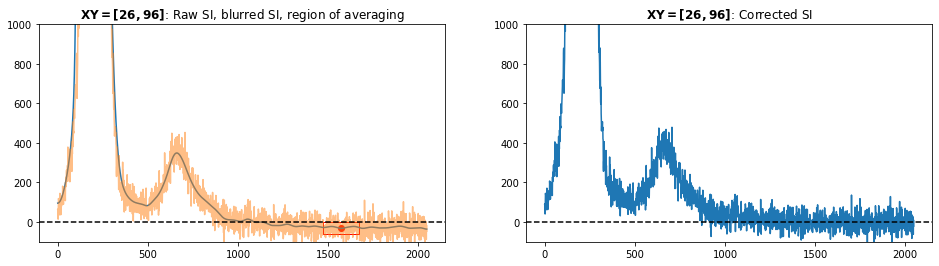

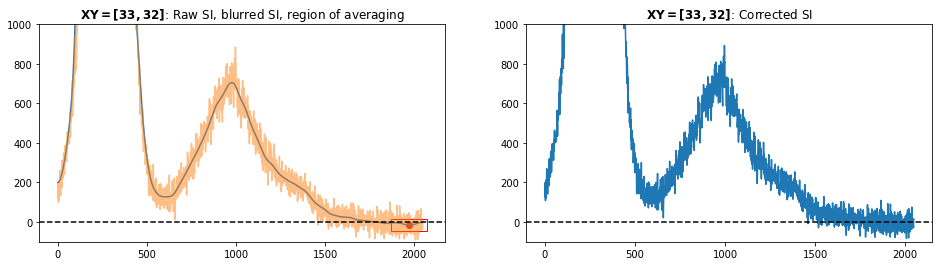

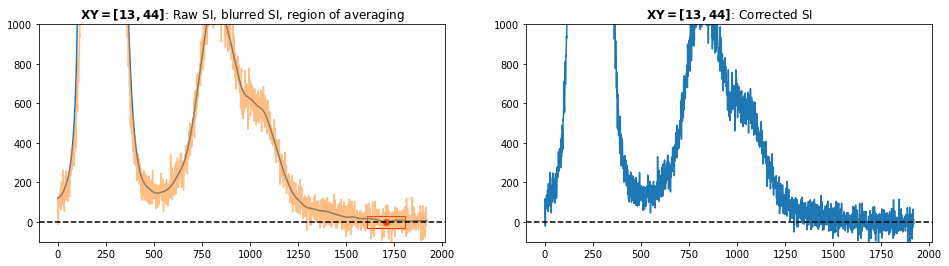

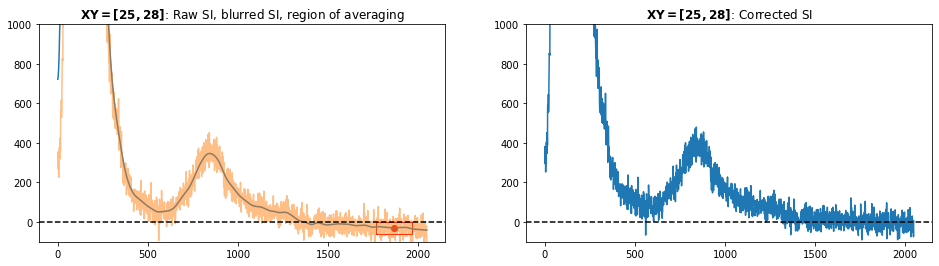

In [ ]:
#@title Doing some processing...

SI1raw, XY1, disp1, SI1raw_flat = OrganizeInput(filename1) 
SI1nc = CorrectNeg(SI1raw, Blur = 20, Neg = -20, Pixrange = 200)
SI1ncflat = SI1nc.reshape((np.prod(XY1),SI1nc.shape[2]))
EnergyAxes1=CalibrateEnergyAxis(SI1nc,disp1)                  # align ZLP & use dispersion to go from pixel -> eV
Eaxflat1=EnergyAxes1.reshape((np.prod(XY1),SI1nc.shape[2]))    # flatten
E1,SI1=CalibrateSI(EnergyAxes1,SI1nc, N = 5000)                # calibrate energies by making all pixels start and end at same energy values
SI1flat=SI1.reshape((np.prod(XY1),SI1.shape[2]))               # flatten

SI2raw, XY2, disp2, SI2raw_flat = OrganizeInput(filename2) 
SI2nc = CorrectNeg(SI2raw, Blur = 20, Neg = -20, Pixrange = 200)
SI2ncflat = SI2nc.reshape((np.prod(XY2),SI2nc.shape[2]))
EnergyAxes2=CalibrateEnergyAxis(SI2nc,disp2)                  # align ZLP & use dispersion to go from pixel -> eV
Eaxflat2=EnergyAxes2.reshape((np.prod(XY2),SI2nc.shape[2]))    # flatten
E2,SI2=CalibrateSI(EnergyAxes2,SI2nc, N = 5000)                # calibrate energies by making all pixels start and end at same energy values
SI2flat=SI2.reshape((np.prod(XY2),SI2.shape[2]))               # flatten

SI3raw, XY3, disp3, SI3raw_flat = OrganizeInput(filename3) 
SI3nc = CorrectNeg(SI3raw, Blur = 20, Neg = -20, Pixrange = 200)
SI3ncflat = SI3nc.reshape((np.prod(XY3),SI3nc.shape[2]))
EnergyAxes3=CalibrateEnergyAxis(SI3nc,disp3)                  # align ZLP & use dispersion to go from pixel -> eV
Eaxflat3=EnergyAxes3.reshape((np.prod(XY3),SI3nc.shape[2]))    # flatten
E3,SI3=CalibrateSI(EnergyAxes3,SI3nc, N = 5000)                # calibrate energies by making all pixels start and end at same energy values
SIflat3=SI3.reshape((np.prod(XY3),SI3.shape[2]))               # flatten

SI4raw, XY4, disp4, SI4raw_flat = OrganizeInput(filename4) 
SI4nc = CorrectNeg(SI4raw, Blur = 20, Neg = -20, Pixrange = 200)
SI4ncflat = SI4nc.reshape((np.prod(XY4),SI4nc.shape[2]))
EnergyAxes4=CalibrateEnergyAxis(SI4nc,disp4)                  # align ZLP & use dispersion to go from pixel -> eV
Eaxflat4=EnergyAxes4.reshape((np.prod(XY4),SI4nc.shape[2]))    # flatten
E4,SI4=CalibrateSI(EnergyAxes4,SI4nc, N = 5000)                # calibrate energies by making all pixels start and end at same energy values
SIflat4=SI4.reshape((np.prod(XY4),SI4.shape[2]))               # flatten


# The two regions are from r1a:r1b  and r2a:r2b
r1a, r1b, r2a, r2b = 0.075, 0.08, 0.17, 0.2

# dataset 1
NBCalc1=np.asarray([[RemoveBackgroundSI2R(E1,s,r1a,r1b,r2a,r2b) for s in row] for row in SI1])
SINB1=NBCalc1[:,:,1,:]
ENB1=NBCalc1[0,0,0,:]
SINB1flat=SINB1.reshape((np.prod(XY1),SINB1.shape[2]))

# dataset 2
NBCalc2=np.asarray([[RemoveBackgroundSI2R(E2,s,r1a,r1b,r2a,r2b) for s in row] for row in SI2])
SINB2=NBCalc2[:,:,1,:]
ENB2=NBCalc2[0,0,0,:]
SINB2flat=SINB2.reshape((np.prod(XY2),SINB2.shape[2]))

# dataset 3
NBCalc3=np.asarray([[RemoveBackgroundSI2R(E3,s,r1a,r1b,r2a,r2b) for s in row] for row in SI3])
SINB3=NBCalc3[:,:,1,:]
ENB3=NBCalc3[0,0,0,:]
SINB3flat=SINB3.reshape((np.prod(XY3),SINB3.shape[2]))

# dataset 4
NBCalc4=np.asarray([[RemoveBackgroundSI2R(E4,s,r1a,r1b,r2a,r2b) for s in row] for row in SI4])
SINB4=NBCalc4[:,:,1,:]
ENB4=NBCalc4[0,0,0,:]
SINB4flat=SINB4.reshape((np.prod(XY4),SINB4.shape[2]))

In [ ]:
#@title HAADF loading
haadf1 = '/content/HAADF_FITO10_holeinarray_1.npy'
haadf2 = '/content/HAADF_FITO0_array_edgewithgap.npy'
haadf3 = '/content/ADF10_array1.npy'
haadf4 = '/content/HAADF_FITO0_array4x4.npy'

ADF1, ADF1scale = LoadADF(haadf1)
ADF2, ADF2scale = LoadADF(haadf2)
ADF3, ADF3scale = LoadADF(haadf3)
ADF4, ADF4scale = LoadADF(haadf4)

# Prepared spectral and structural data:

* SINB ("spectrum image no background") is the hyperspectral data cube, 
* ENB ("energy no background") provides the x-axis for the spectra but is technically not needed for subsequent analysis)
* ADF is the purely structural (aligned) image

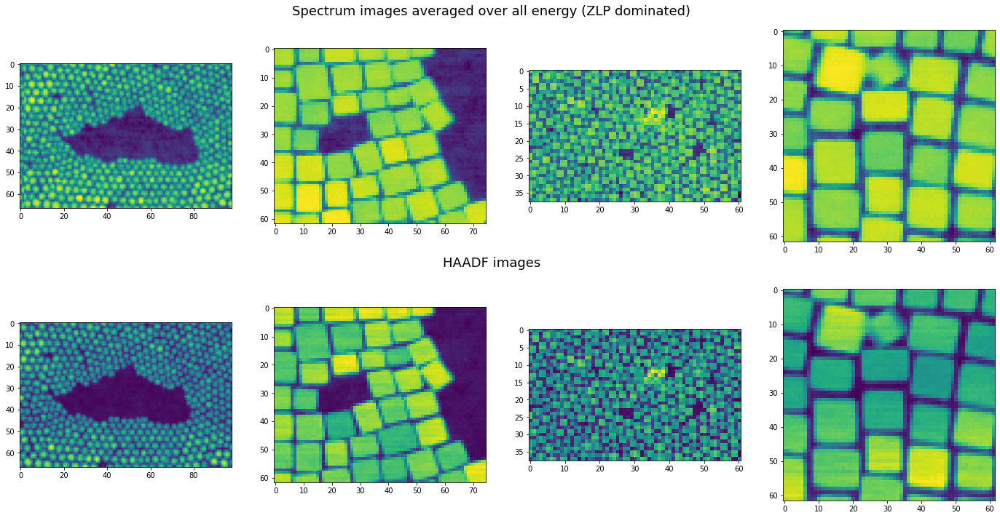

In [ ]:
# Let's show the similarity between the structural image by ZLP contrast (since it dominates the spectrum) and the structure by HAADF:

# structure by "integrating" (really just averaging) entire spectra
f,a = plt.subplots(2,4,figsize=(24,12))

plt.gcf().text(0.5, 0.9, "Spectrum images averaged over all energy (ZLP dominated)", fontsize=18, ha = 'center')

a[0,0].imshow(np.mean(SI1[:,:,:],axis=2), cmap = 'viridis_r')
a[0,1].imshow(np.mean(SI2[:,:,:],axis=2), cmap = 'viridis_r')
a[0,2].imshow(np.mean(SI3[:,:,:],axis=2), cmap = 'viridis_r')
a[0,3].imshow(np.mean(SI4[:,:,:],axis=2), cmap = 'viridis_r')



# Structure by HAADF detector (normally considered the structural data)
plt.gcf().text(0.5, 0.5, "HAADF images", fontsize=18, ha = 'center')
a[1,0].imshow(ADF1)
a[1,1].imshow(ADF2)
a[1,2].imshow(ADF3)
a[1,3].imshow(ADF4)

Check specific spectral windows if desired:

(1815, 3097)

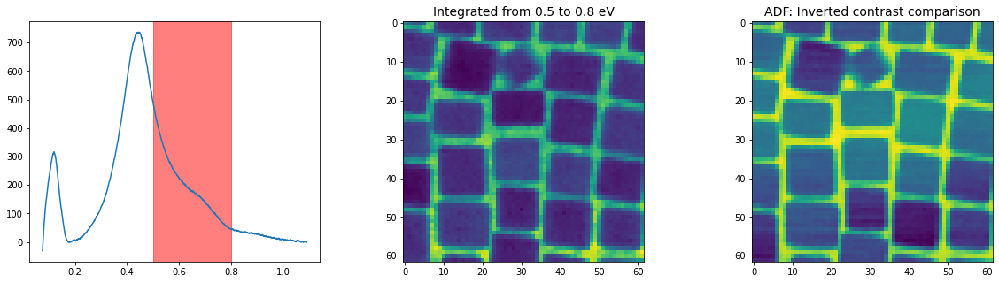

In [ ]:
x1, x2 = 0.5, 0.8  # in eV

e1, e2 = (np.abs(ENB4-x1)).argmin(), (np.abs(ENB4-x2)).argmin()
fig,ax = plt.subplots(1,3,figsize=(20,5))
ax[0].plot(ENB4,np.mean(SINB4[:,:,:],axis=(0,1)))
ax[0].axvspan(x1,x2, color = 'r', alpha = 0.5)
ax[1].imshow(np.mean(SINB4[:,:,e1:e2],axis=2))
ax[1].set_title('Integrated from {} to {} eV'.format(x1,x2), fontsize = 14)
ax[2].imshow(ADF4, cmap = 'viridis_r')
ax[2].set_title('ADF: Inverted contrast comparison', fontsize = 14)

e1,e2

Display HAADF with scalebar

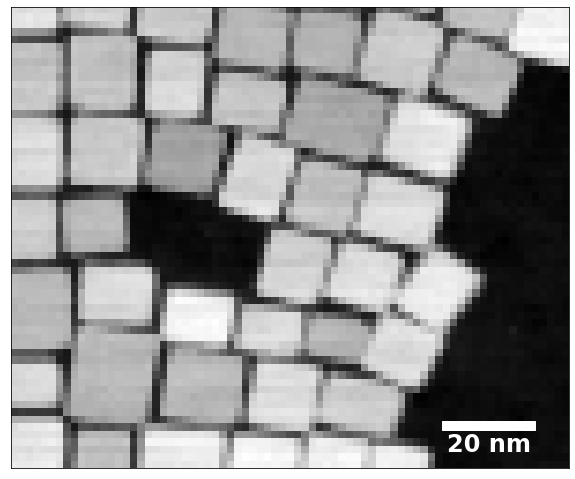

In [ ]:
img = ADF2
scale = ADF2scale
scalebarlength = 20      # nm units

# Positioning
xpos = 0.85
ypos = 0.075

SB = scalebarlength/scale
fig,ax = plt.subplots(figsize = (10,10))
ax.imshow(img, origin = 'lower', cmap ='gray')

xx = xpos*img.shape[1] - SB/2
yy = ypos*img.shape[0]

r1 = patches.Rectangle((xx, yy), SB, 1.25, color = 'w')
ax.add_patch(r1)
ax.annotate("{} nm".format(scalebarlength), (xx+SB/2, yy-3), 
            color = 'w', weight = 'bold', fontsize = 24, 
            ha = 'center')

plt.setp(ax, xticks=[], yticks=[]);

# Standard NMF extraction

In [ ]:
from sklearn.decomposition import NMF

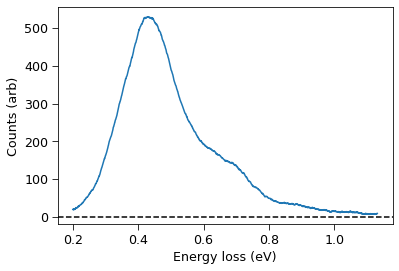

In [ ]:
data = SINB2
energy_axis_ = ENB2

data_XY = (data.shape[0],data.shape[1])
data_flat = np.reshape(data, (data.shape[0]*data.shape[1], data.shape[2]))
    
cutoff_energy = 0.2 # cut energies lower than this-- removes effect of silicon nitride phonons
idx = (np.abs(energy_axis_-cutoff_energy)).argmin()
energy_axis = energy_axis_[idx:]

fsize = 14
plt.figure()
SIdecon=np.copy(data_flat[:,idx:])
SIdecon[np.where(SIdecon<0)]=0
plt.plot(energy_axis,np.mean(SIdecon[:,:],axis=(0)))
plt.axhline(0,color='k',ls='--')
plt.xlabel('Energy loss (eV)', fontsize=fsize*0.9)
plt.ylabel('Counts (arb)', fontsize = fsize*0.9)
plt.tick_params(labelsize = fsize*0.9, size = 6)

Text(0, 0.5, 'Counts')

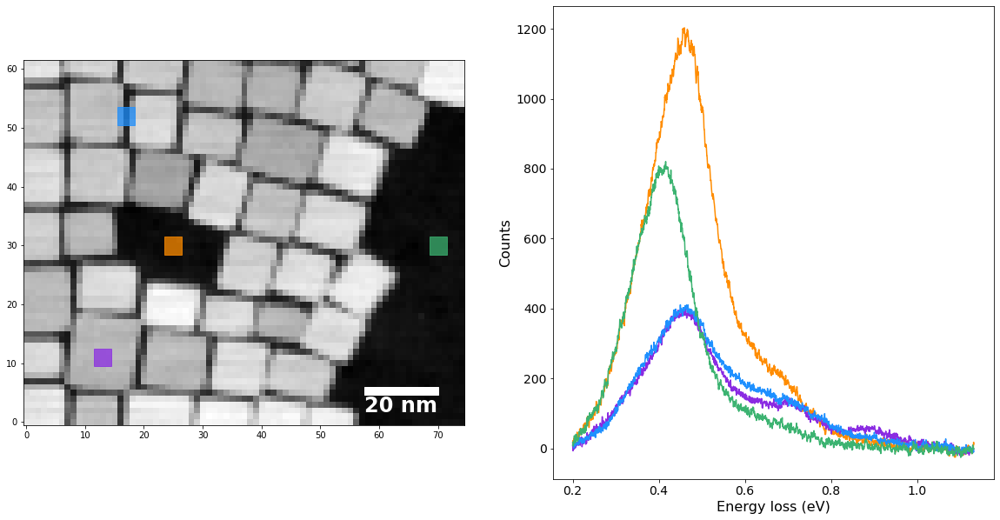

In [ ]:
# Display selected spectra at particular positions (or small ROIs to help average out the signal)

img = ADF2
scale = ADF2scale
scalebarlength = 20      # nm units

# Positioning
xpos = 0.85
ypos = 0.075

SB = scalebarlength/scale
fig,ax = plt.subplots(1,2,figsize = (20,10))
ax[0].imshow(img, origin = 'lower', cmap ='gray')

xx = xpos*img.shape[1] - SB/2
yy = ypos*img.shape[0]

r1 = patches.Rectangle((xx, yy), SB, 1.25, color = 'w')
ax[0].add_patch(r1)
ax[0].annotate("{} nm".format(scalebarlength), (xx+SB/2, yy-3), 
            color = 'w', weight = 'bold', fontsize = 24, 
            ha = 'center')

winsize = 3

# select centers of ROIs of interest
ROI1 = [25,30]
ROI2 = [13,11]
ROI3 = [17,52]
ROI4 = [70,30]
ROIs = np.array([ROI1, ROI2, ROI3, ROI4])

colors = ['darkorange', 'blueviolet', 'dodgerblue', 'mediumseagreen']
for k in range(len(ROIs)):
  ax[0].add_patch(patches.Rectangle((ROIs[k,0]-winsize/2, ROIs[k,1]-winsize/2), winsize, winsize, color = colors[k], alpha = 0.75))
  ax[1].plot(energy_axis, np.mean(data[ROIs[k,1]-winsize:ROIs[k,1]+winsize, ROIs[k,0]-winsize:ROIs[k,0]+winsize, idx:],axis = (0,1)), color = colors[k])

ax[1].tick_params(labelsize = 14)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 16)
ax[1].set_ylabel('Counts', fontsize = 16)

Text(0.5, 1.0, 'Scree plot')

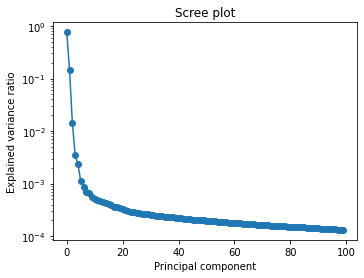

In [ ]:
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()
pca.fit(data_flat[:,idx:])
explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

In [ ]:
N=5

model=NMF(n_components=N)
NMFIm=model.fit_transform(SIdecon[:,:])
NMFSpec=model.components_
NMFIm=NMFIm.reshape(data_XY+(N,)).transpose(2,0,1)

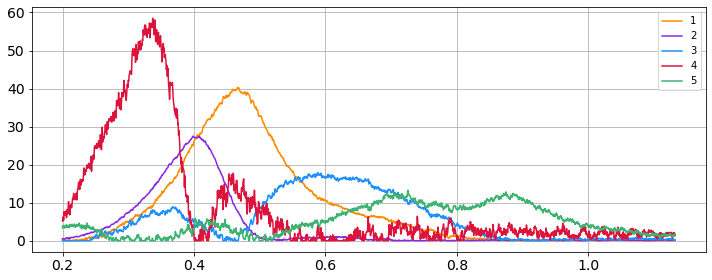

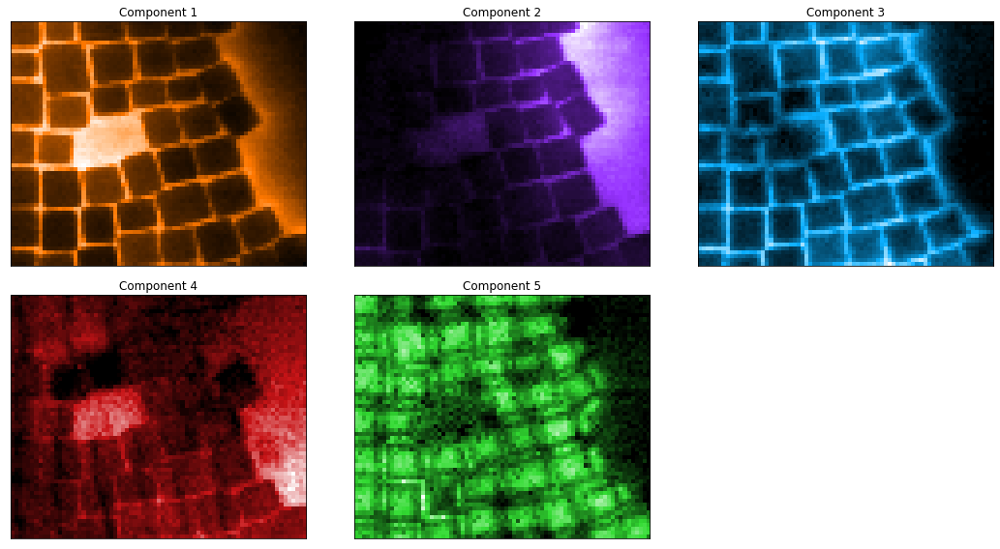

In [ ]:
colors=['DarkOrange','BlueViolet','DodgerBlue','Crimson','MediumSeaGreen','Tan','HotPink','Yellow','Black']
cmaps=[bOw,bPw,bBw,bRw,bGw,bBrw,bPiw,bYw]

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for i in range(N):
    ax1.plot(energy_axis,NMFSpec[i], color = colors.pop(0), label = i+1)
    ax1.grid(True)
    ax1.tick_params(labelsize=14)
    ax1.legend()
plt.tight_layout()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for i in range(N):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(NMFIm[i],cmap = cmaps.pop(0))
#     ax2.imshow(NMFIm[i],cmap = 'magma')
    ax2.set_title('Component ' + str(i+1))
    plt.setp([ax2],xticks=[], yticks=[])
plt.tight_layout()

* For this particular guy I'd prefer to leave out the red component (#4), as it is partially related to an artifact

In [ ]:
# ignore component #4  (which is really 3 because we count 0)

NMFSpectra = np.array([NMFSpec[0], NMFSpec[1], NMFSpec[2], NMFSpec[4]])
NMFImages = np.array([NMFIm[0], NMFIm[1], NMFIm[2], NMFIm[4]])

<font size = 5> Figure 1 </font>

Organization:
* ADF, some various spectra at different locations, and what a suitable machine learning approach can reveal (eigenmodes and maps)

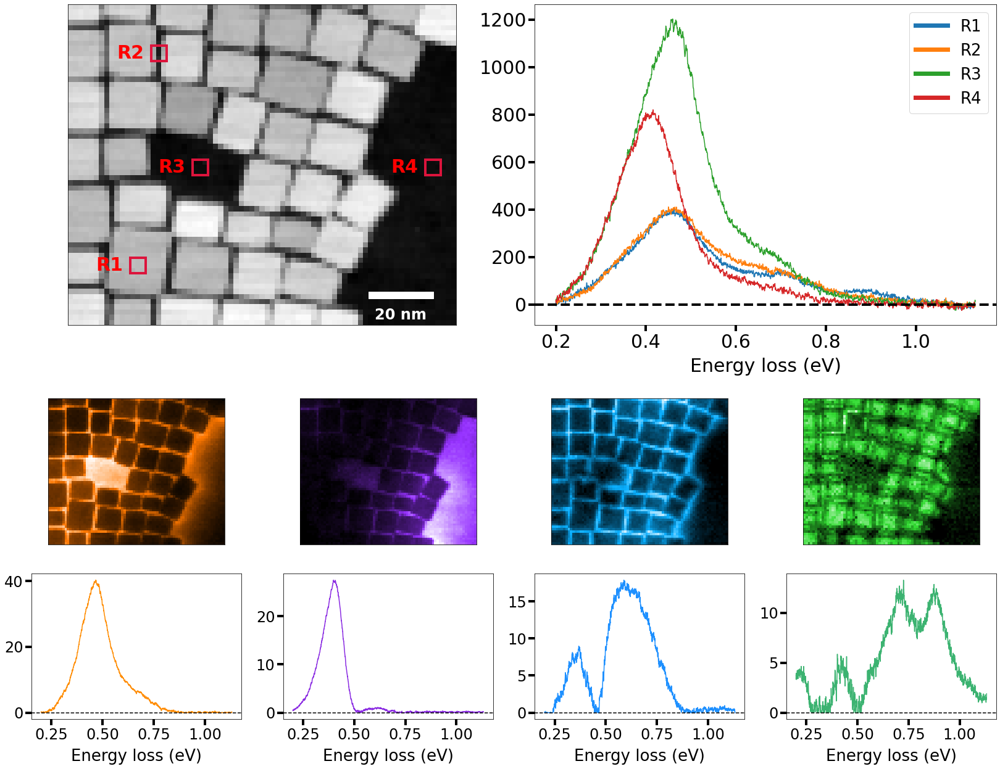

In [ ]:
# Shows nicely everything I think:
# hole in array, edge of array, decent close up can see response inside particle, edge of particle, etc.

# SETUP FIGURE (choose data set, scale bars, ROIs, aspect ratio, etc.)
img = ADF2
scale = ADF2scale
scalebarlength = 20  
fsize = 20

figx, figy = 7, 5
figscale = 4


colors=['DarkOrange','BlueViolet','DodgerBlue', 'MediumSeaGreen', 'Crimson','Tan','HotPink','Yellow','Black']
cmaps=[bOw,bPw,bBw,bGw,bGw,bBrw,bPiw,bYw]


plt.figure(figsize=(figx*figscale,figy*figscale))
gs = gridspec.GridSpec(4,4, height_ratios = [1,1,1,1])
ax00,ax01 = plt.subplot(gs[0:2,0:2]), plt.subplot(gs[0:2,2:4])
ax10,ax11,ax12,ax13 = plt.subplot(gs[2,0]), plt.subplot(gs[2,1]), plt.subplot(gs[2,2]), plt.subplot(gs[2,3])
ax20,ax21,ax22,ax23 = plt.subplot(gs[3,0]), plt.subplot(gs[3,1]), plt.subplot(gs[3,2]), plt.subplot(gs[3,3])

    # nm units

# Positioning
xpos = 0.85
ypos = 0.075
SB = scalebarlength/scale

ax00.imshow(img, origin = 'lower', cmap ='gray')

xx = xpos*img.shape[1] - SB/2
yy = ypos*img.shape[0]

r1 = patches.Rectangle((xx, yy), SB, 1.25, color = 'w')
ax00.add_patch(r1)
ax00.annotate("{} nm".format(scalebarlength), (xx+SB/2, yy-4), 
              color = 'w', weight = 'bold', fontsize = 24, 
              ha = 'center')

# Slightly shift up the top two subplots
topaxes = [ax00, ax01]
for ax in topaxes:
  box = ax.get_position()
  box.y0 = box.y0 + 0.05
  box.y1 = box.y1 + 0.05
  ax.set_position(box)

### NMF PLOTTING ###

axims = [ax10,ax11,ax12,ax13]
axspec = [ax20,ax21,ax22,ax23]

for ax in range(len(axims)):
  axims[ax].imshow(NMFImages[ax], origin = 'lower', cmap = cmaps[ax])
  # axims[ax].set_title('NMF {}'.format(ax+1), fontsize = fsize*1.2)

for ax in range(len(axspec)):
  axspec[ax].plot(energy_axis, NMFSpectra[ax], color = colors[ax])
  axspec[ax].set_xlabel('Energy loss (eV)', fontsize = fsize*1.3, labelpad = 10)
  axspec[ax].set_xticks([0.25, 0.5, 0.75, 1.0])
  axspec[ax].tick_params(labelsize = 1.2*fsize, size = 10, width = 4)
  axspec[ax].axhline(0, ls='--', c='k')

plt.setp([ax00,ax10,ax11,ax12,ax13], xticks=[], yticks=[]);

# Display selected spectra at particular positions (or small ROIs to help average out the signal)
winsize = 3

# select centers of ROIs of interest

ROI1 = [13,11]
ROI2 = [17,52]
ROI3 = [25,30]
ROI4 = [70,30]
ROIs = np.array([ROI1, ROI2, ROI3, ROI4])

colors = ['darkorange', 'blueviolet', 'dodgerblue', 'mediumseagreen']
for k in range(len(ROIs)):
  ax00.add_patch(patches.Rectangle((ROIs[k,0]-winsize/2, ROIs[k,1]-winsize/2), winsize, winsize, edgecolor = 'crimson', fill=None, linewidth = 4))
  ax00.annotate('R{}'.format(k+1), (ROIs[k,0]-5.5, ROIs[k,1]), ha = 'center', va = 'center', color = 'r', fontsize = fsize*1.5, weight = 'bold')
  ax01.plot(energy_axis, np.mean(data[ROIs[k,1]-winsize:ROIs[k,1]+winsize, ROIs[k,0]-winsize:ROIs[k,0]+winsize, idx:],axis = (0,1)), label = 'R{}'.format(k+1))
leg01 = ax01.legend(fontsize = fsize*1.3)

for jj in leg01.legendHandles:
    jj.set_linewidth(7)

ax01.set_xlabel('Energy loss (eV)', fontsize = fsize*1.5, labelpad = 10)
# ax01.set_ylabel('Counts (arb)', fontsize = fsize*1.3, labelpad = 5)
ax01.tick_params(labelsize = fsize * 1.5, size = 10, width = 4)
ax01.axhline(0, ls='--', c='k', linewidth = 4)

April 4, 2020

Adding Multivariate analysis

Sergei V. Kalinin, based on Maxim Ziatdinov EELS code

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn import mixture
from sklearn import decomposition
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy import signal

In [ ]:
input_image = SINB2
energy_axis_ = ENB2
cutoff_energy = 0.2 # cut energies lower than this-- removes effect of silicon nitride phonons

d1, d2, d3 = input_image.shape
X_vec_ = input_image.reshape(d1*d2, d3)

#If normalize
X_vec_ = (X_vec_ - np.min(X_vec_)) / np.ptp(X_vec_)

# energy axis
data = np.copy(input_image)
data_XY = (data.shape[0],data.shape[1])
data_flat = np.reshape(data, (data.shape[0]*data.shape[1], data.shape[2]))
    
idx = (np.abs(energy_axis_-cutoff_energy)).argmin()
energy_axis = energy_axis_[idx:]

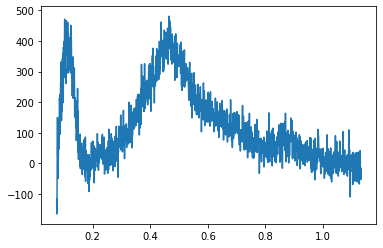

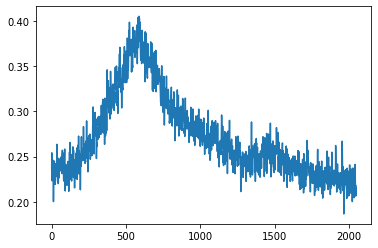

In [ ]:
#If cutoff
d3 = 2048
truncate = np.abs(ENB2-cutoff_energy).argmin()


# # switching this around: never mind....

X_vec = X_vec_[:, truncate:]

# Resample/"Squeeze" the energy axis into 2048 channels
num_ch = 2048

X_vec_resample = np.zeros((X_vec.shape[0], num_ch))
for k in range(X_vec.shape[0]):
  X_vec_resample[k] = signal.resample(X_vec[k], num_ch)

# Put back to original name:

X_vec = np.copy(X_vec_resample)

plt.plot(ENB2,SINB2[0,0])
# plt.axvline(ENB2[502])

plt.figure()
plt.plot(X_vec[0])

In [ ]:
# Select number of components
nc = 24 

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'NMF'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')

X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(24, 2048) (4650, 24)


NUMBER OF COMPONENTS: 24
Components...


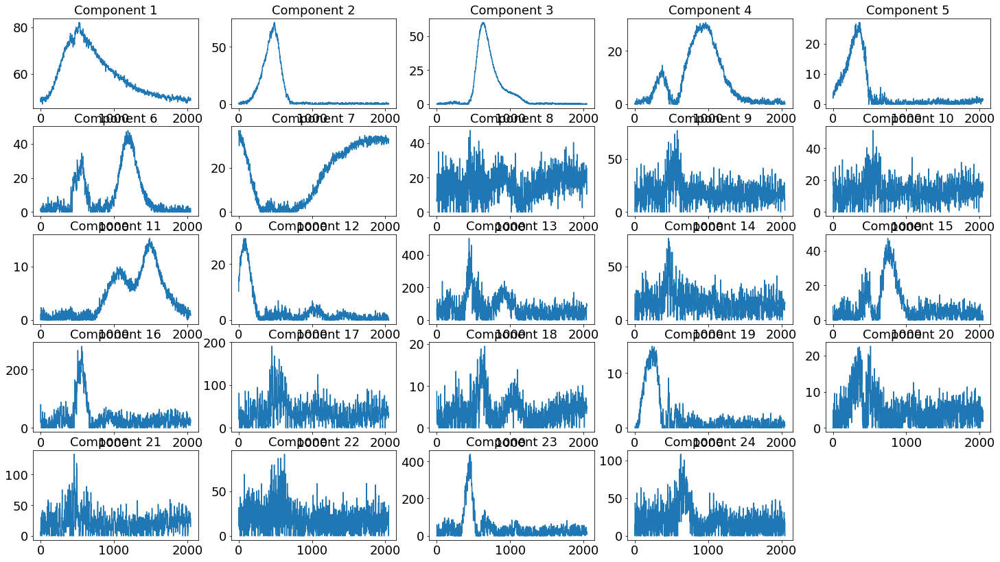

Abundance maps...


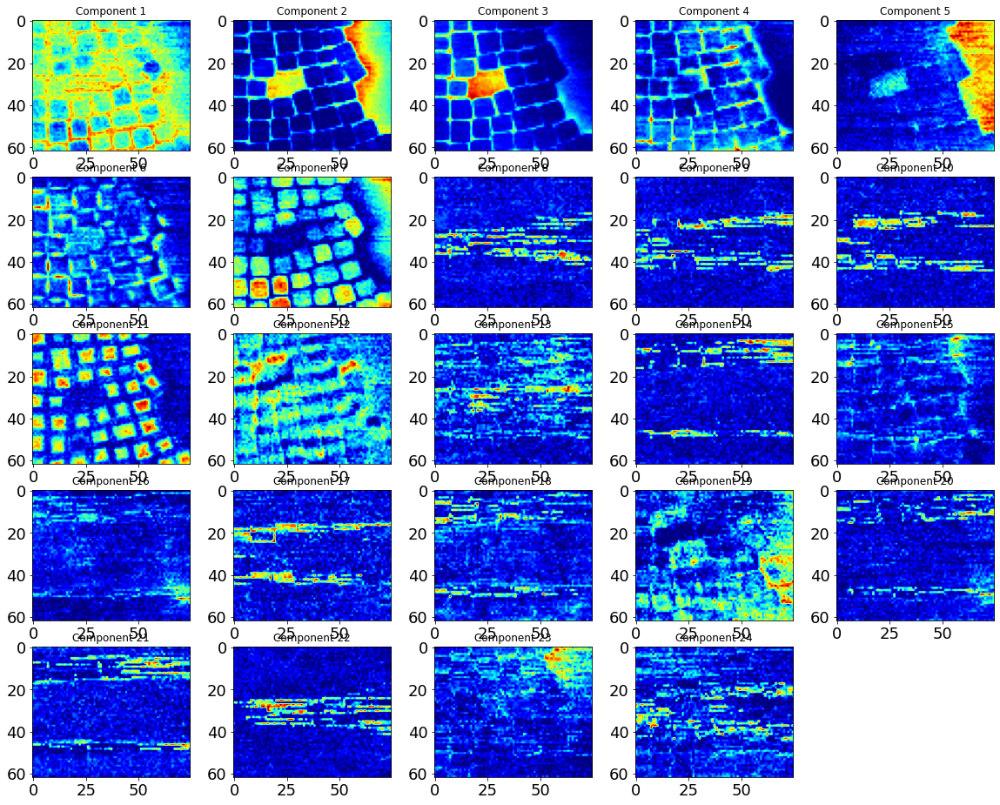

62 75


In [ ]:
rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

print('NUMBER OF COMPONENTS: ' + str(nc))
print('Components...')
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize = (5*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(100*components[i])
    ax1.set_title('Component ' + str(i + 1), fontsize = 18)
    plt.tick_params(labelsize = 18)
plt.show()

print('Abundance maps...')
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = 'jet')
    ax2.set_title('Component ' + str(i + 1))
    plt.tick_params(labelsize = 18)
plt.show()

print(d1, d2)

Outlier correction / cleanup ?

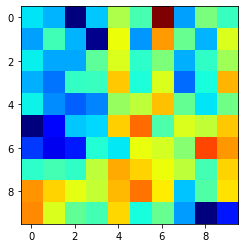

In [ ]:
# For SI1

#Clean up outliers.
#Since there are few, manually
#First vertical, then horizontal, dummy
plt.imshow(X_vec_t[:, 6].reshape(d1, d2)[0:10, 10:20], cmap = 'jet')

In [ ]:
# For S4
#plt.plot(input_image[59,50,2400:2500])
#input_image[59,50,2420:2460] = 1400.

# For S1
# plt.plot(input_image[8,17,1400:1500])
# input_image[8,17,1420:1460] = 300.

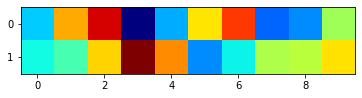

In [ ]:
# For SI4

#Clean up outliers.
#Since there are few, manually
#First vertical, then horizontal, dummy
plt.imshow(X_vec_t[:, 4].reshape(d1, d2)[58:60, 50:60], cmap = 'jet')

# Prepare data for autoencoder

In [ ]:
data = SINB2
energy_axis_ = ENB2
cutoff_energy = 0.2 # cut energies lower than this-- removes effect of silicon nitride phonons


data_XY = (data.shape[0],data.shape[1])
data_flat = np.reshape(data, (data.shape[0]*data.shape[1], data.shape[2]))
    
idx = (np.abs(energy_axis_-cutoff_energy)).argmin()
energy_axis = energy_axis_[idx:]

May 13, 2020

Sergei V. Kalinin

Adding the im2spec and spec2im networks.

0.19990573775542297 1.1317085079575446 (2048,)
(62, 75)
(62, 75, 2048)


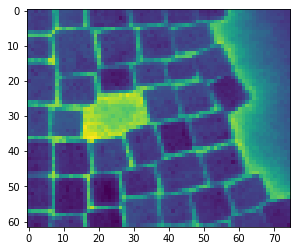

In [ ]:
# Take ADF image
# And spectral data set after cleaning

stem_image = ADF2
spectral_image = X_vec.reshape(d1, d2, d3)
reshaped_eaxis = np.linspace(energy_axis.min(), energy_axis.max(), num = target_arr.shape[1])

#check it
print(reshaped_eaxis.min(), reshaped_eaxis.max(), reshaped_eaxis.shape)
print(stem_image.shape)
print(spectral_image.shape)

plt.imshow(np.mean(spectral_image[:,:,:],axis=2))

In [ ]:
def MakeWindow(imgsrc, xpos, ypos):
    #Returns the portion of the image within the window given the
    #image (imgsrc), the xposition and the yposition
    imgsrc = imgsrc[int(xpos-window_size/2):int(xpos+window_size/2), 
                    int(ypos-window_size/2):int(ypos+window_size/2)]
    return imgsrc

window_size = 16  # 16 is default

# Array to store images
feature_arr = np.zeros((window_size*window_size))
target_arr = np.zeros((d3))
info_arr= np.zeros((2))

for i in range(int(window_size/2), int(d1 - window_size/2)):
  for j in range(int(window_size/2), int(d2 - window_size/2)):
    arr_loc  = MakeWindow(stem_image[:,:], i,j) 
    feature_arr = np.column_stack((feature_arr, arr_loc.reshape(window_size*window_size)))
    target_arr = np.column_stack((target_arr, spectral_image[i,j,:]))
    info_arr = np.column_stack((info_arr, (i,j)))

info_arr = info_arr[:, 1:].T
feature_arr = feature_arr[:, 1:].T.reshape(-1, window_size, window_size)
target_arr = target_arr[:, 1:].T

In [ ]:
#@title
print(feature_arr.shape)
print(target_arr.shape)

(2714, 16, 16)
(2714, 2048)


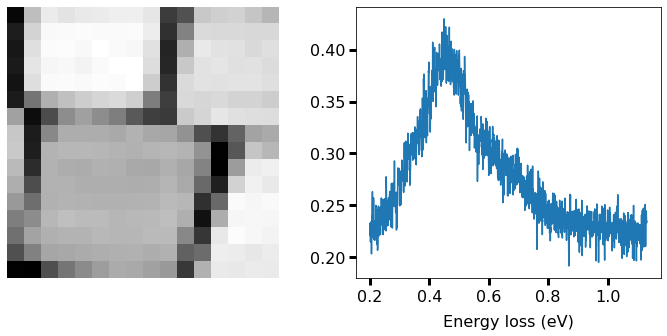

In [ ]:
kk = 2200

fig,ax = plt.subplots(1,2,figsize=(12,5))
ax[0].imshow(feature_arr[kk], origin = 'lower', cmap = 'gray')
ax[1].plot(reshaped_eaxis, target_arr[kk])
ax[1].tick_params(labelsize = 16, width = 3, length = 7)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 16, labelpad = 10)
ax[0].axis('off');

# **PyTorch im2spec**

May 20, 2020

Add PyTorch version made by M. Ziatdinov

In [ ]:
import os
from typing import List, Tuple, Type

import h5py
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn import decomposition
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split

In [ ]:
def rng_seed(seed):
    torch.manual_seed(seed)
    if torch.cuda.is_available(): # for GPU
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

In [ ]:
class dilated_block(nn.Module):
    """
    Creates a "pyramid" with dilated convolutional
    layers (aka atrous convolutions)
    """
    def __init__(self, ndim: int, input_channels: int, output_channels: int,
                 dilation_values: List, padding_values: List,
                 kernel_size: int = 3, stride: int = 1, lrelu_a: float = 0.01,
                 use_batchnorm: bool = False, dropout_: float = 0) -> None:
        """
        Initializes module parameters
        """
        super(dilated_block, self).__init__()
        conv_ = nn.Conv1d if ndim < 2 else nn.Conv2d 
        atrous_module = []
        for idx, (dil, pad) in enumerate(zip(dilation_values, padding_values)):
            input_channels = output_channels if idx > 0 else input_channels
            atrous_module.append(conv_(input_channels,
                                       output_channels,
                                       kernel_size=kernel_size,
                                       stride=stride,
                                       padding=pad,
                                       dilation=dil,
                                       bias=True))
            if dropout_ > 0:
                atrous_module.append(nn.Dropout(dropout_))
            atrous_module.append(nn.LeakyReLU(negative_slope=lrelu_a))
            if use_batchnorm:
                if ndim < 2:
                    atrous_module.append(nn.BatchNorm1d(output_channels))
                else:
                    atrous_module.append(nn.BatchNorm2d(output_channels))
        self.atrous_module = nn.Sequential(*atrous_module)

    def forward(self, x:torch.Tensor) -> torch.Tensor:
        """
        Forward path
        """
        atrous_layers = []
        for conv_layer in self.atrous_module:
            x = conv_layer(x)
            atrous_layers.append(x.unsqueeze(-1))
        return torch.sum(torch.cat(atrous_layers, dim=-1), dim=-1)


class conv_block(nn.Module):
    """
    Creates block of layers each consisting of convolution operation,
    leaky relu and (optionally) dropout and batch normalization
    """
    def __init__(self, ndim: int, nb_layers: int,
                 input_channels: int, output_channels: int,
                 kernel_size: int = 3, stride: int = 1, padding: int = 1,
                 use_batchnorm: bool = False, lrelu_a: float = 0.01,
                 dropout_: float = 0) -> None:
        """
        Initializes module parameters
        """
        super(conv_block, self).__init__()

        conv_ = nn.Conv1d if ndim < 2 else nn.Conv2d 
        block = []
        for idx in range(nb_layers):
            input_channels = output_channels if idx > 0 else input_channels
            block.append(conv_(input_channels,
                               output_channels,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding))
            if dropout_ > 0:
                block.append(nn.Dropout(dropout_))
            block.append(nn.LeakyReLU(negative_slope=lrelu_a))
            if use_batchnorm:
                if ndim < 2:
                    block.append(nn.BatchNorm1d(output_channels))
                else:
                    block.append(nn.BatchNorm2d(output_channels))
        self.block = nn.Sequential(*block)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward path
        """
        output = self.block(x)
        return output

In [ ]:
class im2spec(nn.Module):
    """
    Encoder (2D) - decoder (1D) type model for generating spectra from image
    """
    def __init__(self,
                 feature_size: Tuple[int, int],
                 target_size: int,
                 latent_dim: int = 10,
                 nb_filters_enc: int = 64,
                 nb_filters_dec: int = 64) -> None:
        super(im2spec, self).__init__()
        self.n, self.m = feature_size
        self.ts = target_size
        self.e_filt = nb_filters_enc
        self.d_filt = nb_filters_dec
        # Encoder params
        self.enc_conv = conv_block(
            ndim=2, nb_layers=3,
            input_channels=1, output_channels=self.e_filt,
            lrelu_a=0.1, use_batchnorm=True)
        self.enc_fc = nn.Linear(self.e_filt * self.n * self.m, latent_dim)
        # Decoder params
        self.dec_fc = nn.Linear(latent_dim, self.d_filt*self.ts)
        self.dec_atrous = dilated_block(
            ndim=1, input_channels=self.d_filt, output_channels=self.d_filt,
            dilation_values=[1, 2, 3, 4], padding_values=[1, 2, 3, 4],
            lrelu_a=0.1, use_batchnorm=True)
        self.dec_conv = conv_block(
            ndim=1, nb_layers=1,
            input_channels=self.d_filt, output_channels=1,
            lrelu_a=0.1, use_batchnorm=True)
        self.dec_out = nn.Conv1d(1, 1, 1)
            
    def encoder(self, features: torch.Tensor) -> torch.Tensor:
        """
        The encoder embeddes the input image into a latent vector
        """
        x = self.enc_conv(features)
        x = x.reshape(-1, self.e_filt * self.m * self.n)
        return self.enc_fc(x)
    
    def decoder(self, encoded: torch.Tensor) -> torch.Tensor:
        """
        The decoder generates 1D signal from the embedded features
        """
        x = self.dec_fc(encoded)
        x = x.reshape(-1, self.d_filt, self.ts)
        x = self.dec_atrous(x)
        x = self.dec_conv(x)
        return self.dec_out(x)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward model"""
        encoded = self.encoder(x)
        return self.decoder(encoded)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    feature_arr[:, None, ...], target_arr[:, None, :],
    test_size=0.15, random_state=42, shuffle=True)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2306, 1, 16, 16) (2306, 1, 2048)
(408, 1, 16, 16) (408, 1, 2048)


In [ ]:
minibatch_size = 64
use_gpu = torch.cuda.is_available()

# Prepare data
if isinstance(X_train, np.ndarray):
    tor = lambda x: torch.from_numpy(x).float()
    X_train, X_test = tor(X_train), tor(X_test)
    y_train, y_test = tor(y_train), tor(y_test)

# Transfer to GPU device if available
if use_gpu:
    X_train = X_train.cuda()
    y_train = y_train.cuda()
    X_test = X_test.cuda()
    y_test = y_test.cuda()
    
# Initialize dataloader
data_train = torch.utils.data.TensorDataset(X_train, y_train)
data_test = torch.utils.data.TensorDataset(X_test, y_test)
train_iterator = torch.utils.data.DataLoader(
    data_train, batch_size=minibatch_size, shuffle=True)
test_iterator = torch.utils.data.DataLoader(data_test, batch_size=minibatch_size)

In [ ]:
num_epochs = 10 # number of training epochs
latent_dim = 2 # number of latent dimensions
feature_size = (16, 16)
target_size = 2048
rng_seed(1) # for reproducibility

# Initialize model
ed = im2spec(feature_size, target_size, latent_dim)

if use_gpu:
    torch.cuda.empty_cache()
    ed.cuda()

# Specify optimizer and loss criterion
optimizer = torch.optim.Adam(ed.parameters(), lr=1e-3)
criterion = nn.MSELoss()
train_losses = []
test_losses = []

# Model training
for e in range(num_epochs):
    c, c_test = 0, 0
    losses, losses_test = 0, 0
    ed.train()
    for feature, target in train_iterator:
        b = feature.size(0)
        y_predicted = ed.forward(feature)
        loss = criterion(y_predicted, target)
        loss.backward()
        optimizer.step() 
        optimizer.zero_grad()
        losses += loss.item()
        c += b
    else:
        ed.eval()
        with torch.no_grad():
            for feature, target in test_iterator:
                b = feature.size(0)
                y_predicted = ed.forward(feature)
                loss = criterion(y_predicted, target)
                losses_test += loss.item()
                c_test += b
    train_losses.append(losses / c)
    test_losses.append(losses_test / c_test)
    print('Epoch: {}... Training loss: {}... Test loss: {}'.format(
        e, np.round(train_losses[-1], 7), np.round(test_losses[-1], 7)))

ed.cpu()
X_test, y_test = X_test.cpu(), y_test.cpu()
X_train, y_train = X_train.cpu(), y_train.cpu()

Epoch: 0... Training loss: 0.0095162... Test loss: 0.0006394
Epoch: 1... Training loss: 0.0075552... Test loss: 0.0025736
Epoch: 2... Training loss: 0.0062744... Test loss: 0.0043532
Epoch: 3... Training loss: 0.0053166... Test loss: 0.0053484
Epoch: 4... Training loss: 0.0044511... Test loss: 0.0044789
Epoch: 5... Training loss: 0.0037813... Test loss: 0.0032162
Epoch: 6... Training loss: 0.0032047... Test loss: 0.0026162
Epoch: 7... Training loss: 0.0027473... Test loss: 0.002592
Epoch: 8... Training loss: 0.0023317... Test loss: 0.002301
Epoch: 9... Training loss: 0.0019942... Test loss: 0.0015366


Save trained model:

In [ ]:
savedir = "/content/"
fname = "im2spec-1.pt"
# fname = "im2spec-SI2_50-epoch_v3-10L-energycor.pt"

torch.save(ed.state_dict(), savedir+fname)



In [ ]:
from google.colab import files
files.download(fname)

Load trained model:

In [ ]:
from google.colab import files
files.upload()

Saving im2spec-SI2_50-epoch_v3-2L-energycor.pt to im2spec-SI2_50-epoch_v3-2L-energycor.pt


{'im2spec-SI2_50-epoch_v3-2L-energycor.pt': b'\x80\x02\x8a\nl\xfc\x9cF\xf9 j\xa8P\x19.\x80\x02M\xe9\x03.\x80\x02}q\x00(X\x10\x00\x00\x00protocol_versionq\x01M\xe9\x03X\r\x00\x00\x00little_endianq\x02\x88X\n\x00\x00\x00type_sizesq\x03}q\x04(X\x05\x00\x00\x00shortq\x05K\x02X\x03\x00\x00\x00intq\x06K\x04X\x04\x00\x00\x00longq\x07K\x04uu.\x80\x02ccollections\nOrderedDict\nq\x00)Rq\x01(X\x17\x00\x00\x00enc_conv.block.0.weightq\x02ctorch._utils\n_rebuild_tensor_v2\nq\x03((X\x07\x00\x00\x00storageq\x04ctorch\nFloatStorage\nq\x05X\n\x00\x00\x005560645600q\x06X\x03\x00\x00\x00cpuq\x07M@\x02Ntq\x08QK\x00(K@K\x01K\x03K\x03tq\t(K\tK\tK\x03K\x01tq\n\x89h\x00)Rq\x0btq\x0cRq\rX\x15\x00\x00\x00enc_conv.block.0.biasq\x0eh\x03((h\x04h\x05X\x0f\x00\x00\x00140518225526752q\x0fh\x07K@Ntq\x10QK\x00K@\x85q\x11K\x01\x85q\x12\x89h\x00)Rq\x13tq\x14Rq\x15X\x17\x00\x00\x00enc_conv.block.2.weightq\x16h\x03((h\x04h\x05X\x0f\x00\x00\x00140518243611680q\x17h\x07K@Ntq\x18QK\x00K@\x85q\x19K\x01\x85q\x1a\x89h\x00)Rq\x1b

In [ ]:
weights_path = "/content/im2spec-1.pt"
# weights_path = "/content/im2spec-2_50-epoch.pt"
# weights_path = "/content/im2spec-SI2_50-epoch_v3-2L-energycor.pt"


# initialize a model
# ed = im2spec(feature_size, target_size, latent_dim)
ed = im2spec(feature_size, target_size, 2)

# Load saved weights
if torch.cuda.device_count() > 0:
    checkpoint = torch.load(weights_path)
else:
    checkpoint = torch.load(weights_path, map_location='cpu')
ed.load_state_dict(checkpoint)
# Make sure model is in evaluation state
ed.eval();

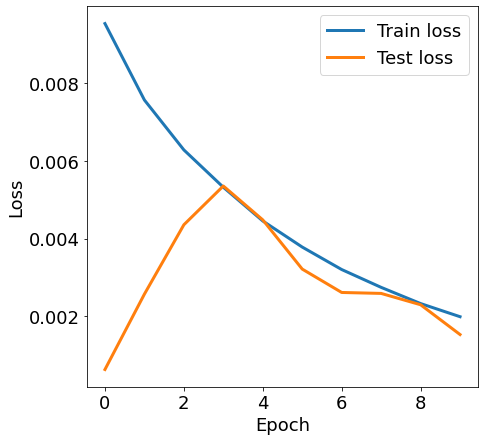

In [ ]:
plt.figure(figsize=(7,7))
plt.plot(train_losses, linewidth=3)
plt.plot(test_losses, linewidth=3)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Loss', fontsize=18)
plt.xlabel('Epoch', fontsize=18)
plt.legend(['Train loss', 'Test loss'], loc='upper right', fontsize=18)
plt.show()

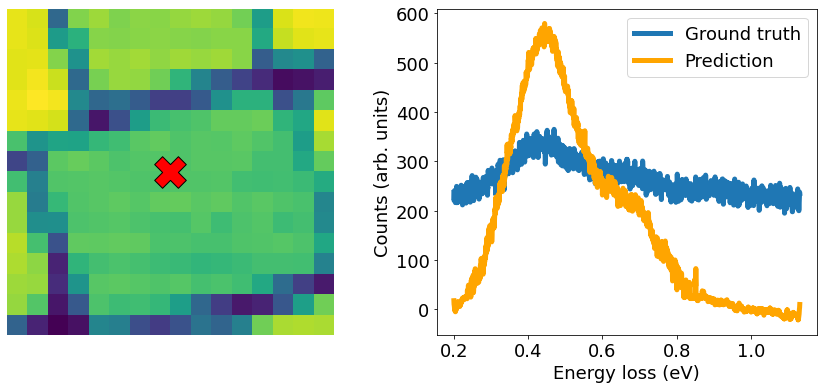

In [ ]:
k = 104 # number of image from validation set for testing

# Make prediction
with torch.no_grad():
    prediction = ed.cpu().forward(X_test[k:k+1])

# Plot results
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
ax1.imshow(X_test[k, 0])
ax1.axis(False)
ax2.plot(reshaped_eaxis,1000*y_test[k, 0], linewidth=5, label='Ground truth')
ax2.plot(reshaped_eaxis,1000*prediction[0, 0], linewidth=5, color='orange', label='Prediction')
ax2.set_xlabel("Energy loss (eV)", fontsize=18)
ax2.set_ylabel("Counts (arb. units)", fontsize=18)
#ax2.set_ylim(-8.5, 8)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax2.legend(fontsize=18, loc='upper right')

ax1.scatter(7.5,7.5,marker = 'X', c='r', s = 1000, edgecolors = 'k')

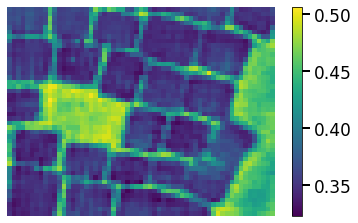

In [ ]:
# This tends to crash Colab. Run last 

def batch_predict(features: np.ndarray, model: Type[nn.Module],
                  target_size: int, num_batches: int = 10) -> np.ndarray:

    features = torch.from_numpy(features[:, None, ...]).float()
    if torch.cuda.is_available():
        model.cuda()
        features = features.cuda()
    batch_size = len(features) // num_batches
    predictions = np.zeros((len(features), 1, target_size))
    for i in range(num_batches):
        if i == num_batches - 1:
            fbatch = features[i*batch_size:]
        else:
            fbatch = features[i*batch_size:(i+1)*batch_size]
        with torch.no_grad():
            pred_i = model.forward(fbatch)
        if i == num_batches - 1:
            predictions[i*batch_size:] = pred_i.cpu().numpy()
        else:
            predictions[i*batch_size:(i+1)*batch_size] = pred_i.cpu().numpy()
    return predictions


pred_loop = batch_predict(feature_arr, ed, target_size)
pred_loop = pred_loop[:, 0, :]
error = (np.mean((pred_loop-target_arr)**2,axis = 1) /
         np.mean((pred_loop+target_arr)**2,axis = 1))**(1/2)
plt.imshow(error.reshape(d1-window_size,d2-window_size), origin = 'lower')
# plt.colorbar(shrink = 0.8, format = '%.2f');
cbar = plt.colorbar(shrink = 0.96, format = '%.2f');
plt.axis('off')
cbar.ax.tick_params(labelsize=17, width = 2, length = 8)

* Calculate MEAN of error of entire image:

In [ ]:
np.mean(error)

0.04761241393371898

* Clustering in latent space:

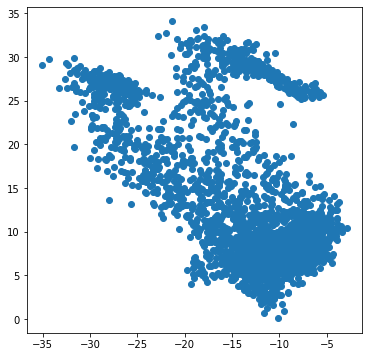

In [ ]:
feature_arr_ = torch.from_numpy(feature_arr[:, None, ...]).float()
if torch.cuda.is_available():
    ed.cuda()
    feature_arr_ = feature_arr_.cuda()
with torch.no_grad():
    latent_features = ed.encoder(feature_arr_).cpu()

plt.figure(figsize=(6, 6))
plt.scatter(latent_features[:,0], latent_features[:,1]);

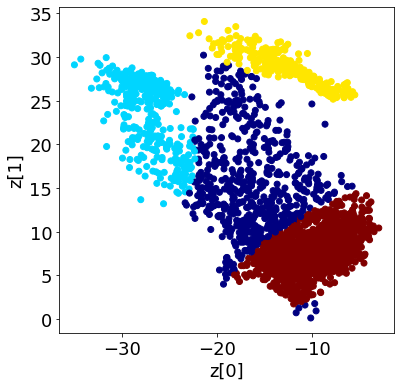

In [ ]:
nc = 4
gmmp = GaussianMixture(n_components=nc, random_state=42)
gmm_zp = gmmp.fit_predict(latent_features)

plt.figure(figsize=(6,6))
plt.scatter(latent_features[:, 0], latent_features[:,1], c=gmm_zp, cmap="jet")
plt.xlabel("z[0]", fontsize = 18)
plt.ylabel("z[1]", fontsize = 18)
plt.tick_params(labelsize = 18)

## This cell not working: ??

In [ ]:
#@title
z0_mean = latent_features[:, 0].mean().numpy()
z1_mean = latent_features[:, 1].mean().numpy()
center = np.array((z0_mean, z1_mean))
spec_av = torch.squeeze(ed.decoder(torch.from_numpy(center).float()).detach())

#plt.plot(components[0])
plt.plot(spec_av)

RuntimeError: ignored

In [ ]:
ed.cpu()
z_mean = latent_features[:, :].mean(axis = 0).numpy()
center = np.array(z_mean)
spec_av = torch.squeeze(ed.decoder(torch.from_numpy(center).float()).detach())

#plt.plot(components[0])
plt.plot(spec_av)

RuntimeError: ignored

In [ ]:
ed.cpu()

nc = 8 # number of components
gmmp = GaussianMixture(n_components=nc, random_state=42) # add random state for reproducibility in the component ordering
centroids = gmmp.fit(latent_features).means_

rows = int(np.ceil(float(nc)/4))
cols = int(np.ceil(float(nc)/rows))

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4.5*(1+rows//1.5)))   
for i, centroid in enumerate(centroids):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.plot(1000*(torch.squeeze(ed.decoder(torch.from_numpy(centroid).float()).detach())-spec_av))
    ax2.set_title('Component ' + str(i + 1), fontsize = 16)
    plt.tick_params(labelsize = 18)
plt.tight_layout()

RuntimeError: ignored

In [ ]:
rows = int(np.ceil(float(nc)/4))
cols = int(np.ceil(float(nc)/rows))

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4.5*(1+rows//1.5)))   
for i, centroid in enumerate(centroids):
    ax2 = fig2.add_subplot(gs2[i])

    comp_arr = []
    for n, feature in enumerate(latent_features.numpy()):
      comp = np.sum((feature[:]-np.squeeze(centroids[i]))**2)
      comp_arr = np.append(comp_arr, comp)

    loc_im = feature_arr[np.argsort(comp_arr)[:3],:, :].mean(axis = 0)
    ax2.imshow(loc_im)
    ax2.set_title('Component ' + str(i + 1))
    plt.tick_params(labelsize = 18)
    ax2.axis(False)
plt.show()

NameError: ignored

<Figure size 1152x324 with 0 Axes>

In [ ]:
xi

-2.940048933029175

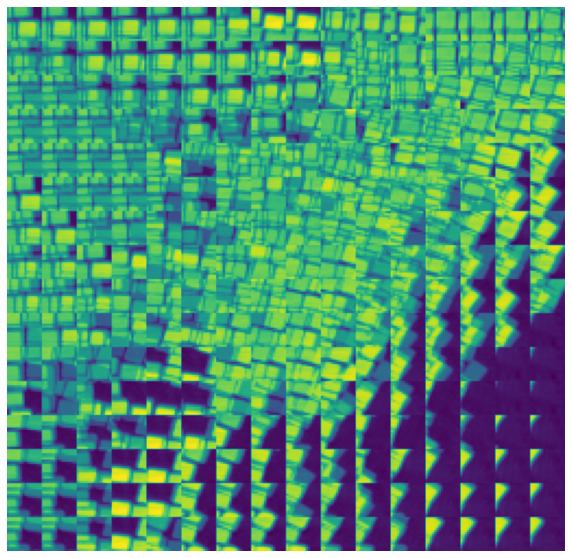

In [ ]:
if latent_features.shape[-1] != 2:
    raise ValueError("Your latent vector last dimension must be equal to 2")

xmin = latent_features[:, 0].min()
ymin = latent_features[:, 1].min()
xmax = latent_features[:, 0].max()
ymax = latent_features[:, 1].max()

n = 16
window_size1 = 16
window_size2 = 16
figure = np.zeros((window_size1 * n, window_size2 * n))

# linearly spaced coordinates corresponding to the 2D plot
# of spectrum classes in the latent space
grid_x = np.linspace(xmin, xmax, n)
grid_y = np.linspace(ymin, ymax, n)[::-1]
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        z = np.array([[xi, yi]])

        comp_arr = []
        for n, feature in enumerate(latent_features):
          comp = torch.sum((feature[:]-np.squeeze(z))**2)
          comp_arr.append(comp)
        loc_im = feature_arr[torch.argsort(torch.Tensor(comp_arr))[:3],:, :].mean(axis = 0)

        figure[i * window_size1: (i + 1) * window_size1,
                j * window_size2: (j + 1) * window_size2] = loc_im

plt.figure(figsize=(10, 10))
plt.xlabel("z[0]")
plt.ylabel("z[1]")
plt.imshow(figure,origin = 'lower', cmap='viridis', aspect = 'auto')
plt.axis(False)
plt.show()

Visualize the SPECTRA instead of the IMAGE in 2D latent space...

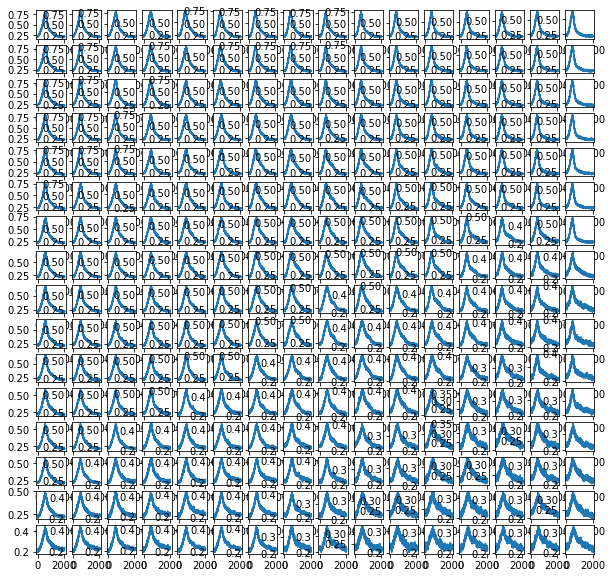

In [ ]:
if latent_features.shape[-1] != 2:
    raise ValueError("Your latent vector last dimension must be equal to 2")

xmin = latent_features[:, 0].min()
ymin = latent_features[:, 1].min()
xmax = latent_features[:, 0].max()
ymax = latent_features[:, 1].max()

n = 16
window_size1 = 16
window_size2 = 16
# figure = np.zeros((window_size1 * n, window_size2 * n))
gs = gridspec.GridSpec(window_size1, window_size2)
fig = plt.figure(figsize = (10,10))


# linearly spaced coordinates corresponding to the 2D plot
# of spectrum classes in the latent space
grid_x = np.linspace(xmin, xmax, n)
grid_y = np.linspace(ymin, ymax, n)[::-1]
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        z = np.array([[xi, yi]])

        comp_arr = []
        for n, feature in enumerate(latent_features):
          comp = torch.sum((feature[:]-np.squeeze(z))**2)
          comp_arr.append(comp)
        loc_spec = target_arr[torch.argsort(torch.Tensor(comp_arr))[:3],:].mean(axis = 0)

        ax = fig.add_subplot(gs[i,j])
        ax.plot(loc_spec)


Too much going on, switch to 8x8 instead:

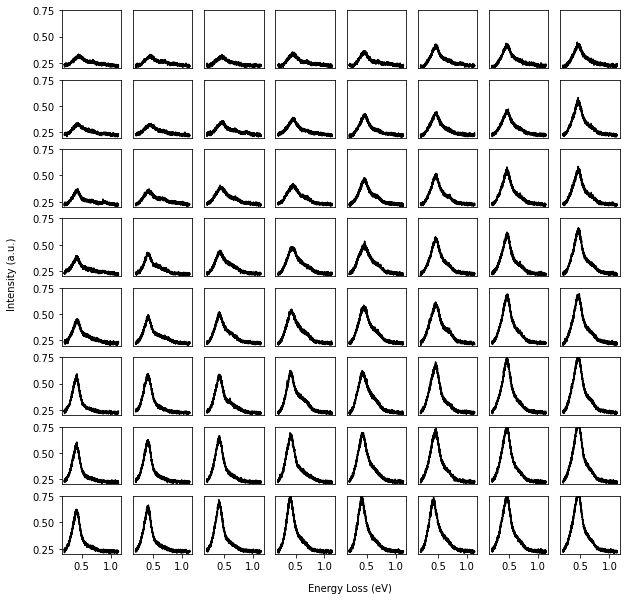

In [ ]:
if latent_features.shape[-1] != 2:
    raise ValueError("Your latent vector last dimension must be equal to 2")

xmin = latent_features[:, 0].min()
ymin = latent_features[:, 1].min()
xmax = latent_features[:, 0].max()
ymax = latent_features[:, 1].max()

n = 8
window_size1 = 8
window_size2 = 8
# figure = np.zeros((window_size1 * n, window_size2 * n))
gs = gridspec.GridSpec(window_size1, window_size2)
fig = plt.figure(figsize = (10,10))

spec_array = np.zeros((n, n, target_arr.shape[1]))

# linearly spaced coordinates corresponding to the 2D plot
# of spectrum classes in the latent space
grid_x = np.linspace(xmin, xmax, n)
grid_y = np.linspace(ymin, ymax, n)[::-1]
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        z = np.array([[xi, yi]])

        comp_arr = []
        for n, feature in enumerate(latent_features):
          comp = torch.sum((feature[:]-np.squeeze(z))**2)
          comp_arr.append(comp)
        loc_spec = target_arr[torch.argsort(torch.Tensor(comp_arr))[:3],:].mean(axis = 0)

        ax = fig.add_subplot(gs[7-i,7-j])
        ax.plot(reshaped_eaxis,loc_spec, c='k')
        ax.set_ylim(0.2,0.75)  # Set common y limits to better compare

        # More plotting details


        # Keep only x ticks for bottom row
        if i != 0:
          ax.axes.get_xaxis().set_ticks([])
        else:
          pass
        # Keep only y ticks for first column (they are all the same so it's fine to do this)
        if j != 7:
          ax.axes.get_yaxis().set_ticks([])
        else:
          pass
        
        # x and y labels for the figure (I guess I could've just added to figure and not to the specific axis.. oh well)
        if i==0 and j==4:
          ax.set_xlabel('Energy Loss (eV)')
          x0, y0 = 1.25, -0.5
          ax.xaxis.set_label_coords(x0, y0)

        if i==3 and j==7:
          ax.set_ylabel('Intensity (a.u.)')
          x0, y0 = -0.75, 1.25
          ax.yaxis.set_label_coords(x0, y0)

        # add to new array, can do PCA or something on it later... is that sensible?
        spec_array[i,j] = loc_spec

# PyTorch spec2im

In [ ]:
class spec2im(nn.Module):
    """
    Encoder (2D) - decoder (1D) type model for generating spectra from image
    """
    def __init__(self,
                 feature_size: int,
                 target_size: Tuple[int, int],
                 latent_dim: int = 10,
                 nb_filters_enc: int = 64,
                 nb_filters_dec: int = 64) -> None:
        super(spec2im, self).__init__()
        self.n, self.m = target_size
        self.fs = feature_size
        self.e_filt = nb_filters_enc
        self.d_filt = nb_filters_dec
        # Encoder params
        self.enc_conv = conv_block(
            ndim=1, nb_layers=4, kernel_size=3,
            input_channels=1, output_channels=self.e_filt,
            lrelu_a=0.1, use_batchnorm=True)
        self.enc_fc = nn.Linear(self.e_filt * self.fs // 32, latent_dim)
        # Decoder params
        self.dec_fc = nn.Linear(latent_dim, self.d_filt * (self.n // 4) * (self.m // 4))
        self.dec_conv_1 = conv_block(
            ndim=2, nb_layers=1,
            input_channels=self.d_filt, output_channels=self.d_filt,
            lrelu_a=0.1, use_batchnorm=True)
        self.dec_conv_2 = conv_block(
            ndim=2, nb_layers=1,
            input_channels=self.d_filt, output_channels=self.d_filt,
            lrelu_a=0.1, use_batchnorm=True)
        self.dec_atrous = dilated_block(
            ndim=2, input_channels=self.d_filt, output_channels=self.d_filt,
            dilation_values=[1, 2, 3, 4], padding_values=[1, 2, 3, 4],
            lrelu_a=0.1, use_batchnorm=True)
        self.dec_conv_3 = conv_block(
            ndim=2, nb_layers=1,
            input_channels=self.d_filt, output_channels=1,
            lrelu_a=0.1, use_batchnorm=True)
        self.dec_out = nn.Conv2d(1, 1, 1)
            
    def encoder(self, features: torch.Tensor) -> torch.Tensor:
        """
        The encoder embeddes the imput signal into a latent vector
        """
        x = F.avg_pool1d(features, 32, 32)
        x = self.enc_conv(x)
        x = x.reshape(-1, self.e_filt * self.fs // 32)
        return self.enc_fc(x)
    
    def decoder(self, encoded: torch.Tensor) -> torch.Tensor:
        """
        The decoder generates 2D image from the embedded features
        """
        x = self.dec_fc(encoded)
        x = x.reshape(-1, self.d_filt, self.n//4, self.m//4)
        x = self.dec_conv_1(x)
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.dec_conv_2(x)
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.dec_atrous(x)
        x = self.dec_conv_3(x)
        return self.dec_out(x)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward model"""
        encoded = self.encoder(x)
        return self.decoder(encoded)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    target_arr[:, None, :], feature_arr[:, None, ...],
    test_size=0.15, random_state=42, shuffle=True)

# Normalize (otherwise the training will be unstable)
X_train = X_train/X_train.max()
X_test = X_test/X_test.max()
y_train = y_train/y_train.max()
y_test = y_test/y_test.max()

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2306, 1, 2048) (2306, 1, 16, 16)
(408, 1, 2048) (408, 1, 16, 16)


In [ ]:
minibatch_size = 64
use_gpu = torch.cuda.is_available()


# Prepare data
if isinstance(X_train, np.ndarray):
    tor = lambda x: torch.from_numpy(x).float()
    X_train, X_test = tor(X_train), tor(X_test)
    y_train, y_test = tor(y_train), tor(y_test)

# Move to GPU if available
if use_gpu:
    X_train = X_train.cuda()
    y_train = y_train.cuda()
    X_test = X_test.cuda()
    y_test = y_test.cuda()
    
# Initialize dataloader
data_train = torch.utils.data.TensorDataset(X_train, y_train)
data_test = torch.utils.data.TensorDataset(X_test, y_test)
train_iterator = torch.utils.data.DataLoader(
    data_train, batch_size=minibatch_size, shuffle=True)
test_iterator = torch.utils.data.DataLoader(data_test, batch_size=minibatch_size)

RuntimeError: ignored

In [ ]:
num_epochs = 50 # number of training epochs
latent_dim = 10 # number of latent dimensions
feature_size = 2048
target_size = (16, 16)
rng_seed(1) # for reproducibility

ed = spec2im(feature_size, target_size, latent_dim)
if use_gpu:
    torch.cuda.empty_cache()
    ed.cuda()
optimizer = torch.optim.Adam(ed.parameters(), lr=1e-3)
criterion = nn.MSELoss()
train_losses = []
test_losses = []
for e in range(num_epochs):
    c, c_test = 0, 0
    losses, losses_test = 0, 0
    ed.train()
    for feature, target in train_iterator:
        b = feature.size(0)
        y_predicted = ed.forward(feature)
        loss = criterion(y_predicted, target)
        loss.backward()
        optimizer.step() 
        optimizer.zero_grad()
        losses += loss.item()
        c += b
    else:
        ed.eval()
        with torch.no_grad():
            for feature, target in test_iterator:
                b = feature.size(0)
                y_predicted = ed.forward(feature)
                loss = criterion(y_predicted, target)
                losses_test += loss.item()
                c_test += b
    train_losses.append(losses / c)
    test_losses.append(losses_test / c_test)
    print('Epoch: {}... Training loss: {}... Test loss: {}'.format(
        e, np.round(train_losses[-1], 5), np.round(test_losses[-1], 5)))

ed.cpu()
X_test, y_test = X_test.cpu(), y_test.cpu()
X_train, y_train = X_train.cpu(), y_train.cpu()

Epoch: 0... Training loss: 0.00154... Test loss: 0.00225
Epoch: 1... Training loss: 0.00106... Test loss: 0.00087
Epoch: 2... Training loss: 0.00086... Test loss: 0.00079
Epoch: 3... Training loss: 0.00075... Test loss: 0.00088
Epoch: 4... Training loss: 0.00071... Test loss: 0.00086
Epoch: 5... Training loss: 0.00066... Test loss: 0.00071
Epoch: 6... Training loss: 0.00065... Test loss: 0.00068
Epoch: 7... Training loss: 0.00062... Test loss: 0.00072
Epoch: 8... Training loss: 0.00061... Test loss: 0.00072
Epoch: 9... Training loss: 0.00063... Test loss: 0.00065
Epoch: 10... Training loss: 0.00061... Test loss: 0.00072
Epoch: 11... Training loss: 0.00059... Test loss: 0.0007
Epoch: 12... Training loss: 0.00059... Test loss: 0.00072
Epoch: 13... Training loss: 0.00066... Test loss: 0.00067
Epoch: 14... Training loss: 0.0006... Test loss: 0.00064
Epoch: 15... Training loss: 0.00061... Test loss: 0.00079
Epoch: 16... Training loss: 0.00059... Test loss: 0.00071
Epoch: 17... Training loss

Save trained model:

In [ ]:
savedir = "/content/"
fname = "spec2im-1.pt"
# fname = "spec2im-2_50-epoch.pt"
# fname = "spec2im-SI2_50-epoch_v3-10L-energycor.pt"

torch.save(ed.state_dict(), savedir+fname)

from google.colab import files
# files.download(fname)

Load trained model:

In [ ]:
from google.colab import files
files.upload()

Saving spec2im-SI2_50-epoch_v3-2L-energycor_REPEATED.pt to spec2im-SI2_50-epoch_v3-2L-energycor_REPEATED.pt


{'spec2im-SI2_50-epoch_v3-2L-energycor_REPEATED.pt': b'\x80\x02\x8a\nl\xfc\x9cF\xf9 j\xa8P\x19.\x80\x02M\xe9\x03.\x80\x02}q\x00(X\x10\x00\x00\x00protocol_versionq\x01M\xe9\x03X\r\x00\x00\x00little_endianq\x02\x88X\n\x00\x00\x00type_sizesq\x03}q\x04(X\x05\x00\x00\x00shortq\x05K\x02X\x03\x00\x00\x00intq\x06K\x04X\x04\x00\x00\x00longq\x07K\x04uu.\x80\x02ccollections\nOrderedDict\nq\x00)Rq\x01(X\x17\x00\x00\x00enc_conv.block.0.weightq\x02ctorch._utils\n_rebuild_tensor_v2\nq\x03((X\x07\x00\x00\x00storageq\x04ctorch\nFloatStorage\nq\x05X\n\x00\x00\x006776477472q\x06X\x03\x00\x00\x00cpuq\x07K\xc0Ntq\x08QK\x00K@K\x01K\x03\x87q\tK\x03K\x03K\x01\x87q\n\x89h\x00)Rq\x0btq\x0cRq\rX\x15\x00\x00\x00enc_conv.block.0.biasq\x0eh\x03((h\x04h\x05X\n\x00\x00\x006775099968q\x0fh\x07K@Ntq\x10QK\x00K@\x85q\x11K\x01\x85q\x12\x89h\x00)Rq\x13tq\x14Rq\x15X\x17\x00\x00\x00enc_conv.block.2.weightq\x16h\x03((h\x04h\x05X\n\x00\x00\x006963089728q\x17h\x07K@Ntq\x18QK\x00K@\x85q\x19K\x01\x85q\x1a\x89h\x00)Rq\x1btq\x1cRq

In [ ]:
feature_size = 2048
target_size = (16,16)

In [ ]:
weights_path = "/content/spec2im-1.pt"
# weights_path = "/content/spec2im-2_50-epoch.pt"
# weights_path = "/content/spec2im-SI2_50-epoch_v3-2L-energycor.pt"
# weights_path = "/content/spec2im-SI2_50-epoch_v3-2L-energycor_REPEATED.pt"

# initialize a model
# ed = spec2im(feature_size, target_size, latent_dim)
ed = spec2im(feature_size, target_size, 2)


# Load saved weights
if torch.cuda.device_count() > 0:
    checkpoint = torch.load(weights_path)
else:
    checkpoint = torch.load(weights_path, map_location='cpu')
ed.load_state_dict(checkpoint)
# Make sure model is in evaluation state
ed.eval();

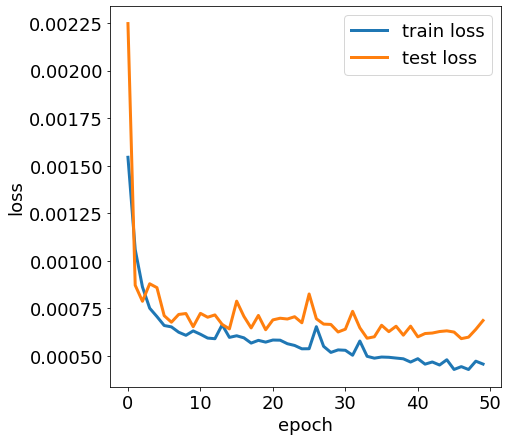

In [ ]:
plt.figure(figsize=(7,7))
plt.plot(train_losses, linewidth=3)
plt.plot(test_losses, linewidth=3)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('loss', fontsize=18)
plt.xlabel('epoch', fontsize=18)
plt.legend(['train loss', 'test loss'], loc='upper right', fontsize=18)
plt.show()

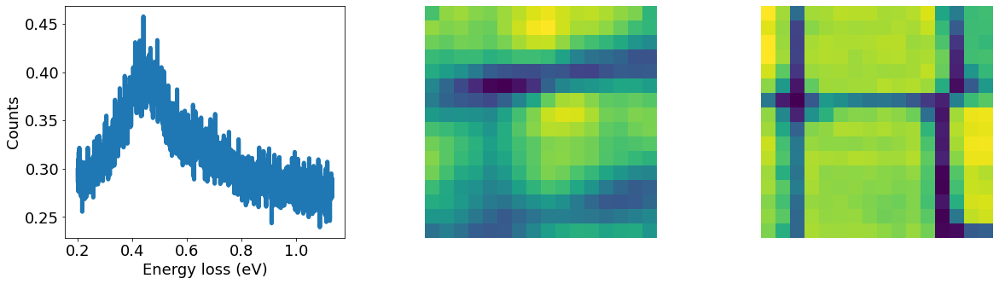

In [ ]:
# k = 317 # spectrum number
k = 123

# prediction with a trained model
with torch.no_grad():
    prediction = ed.forward(X_test[k:k+1])
# plot results
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
ax1.plot(reshaped_eaxis,X_test[k, 0, :], linewidth=5)
ax1.set_xlabel("Energy loss (eV)", fontsize=18)
ax1.set_ylabel("Counts", fontsize=18)
ax1.tick_params(axis='both', which='major', labelsize=18)
ax2.imshow(prediction[0,0])
ax2.axis(False)
ax3.imshow(y_test[k, 0])
ax3.axis(False)
plt.show()

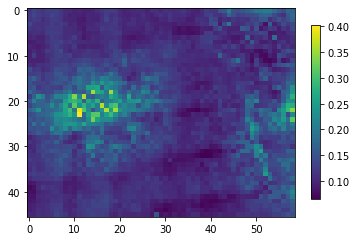

In [ ]:
#Max, why do you divide by target_arr.max()


def batch_predict2(features: np.ndarray, model: Type[nn.Module],
                  target_size: int, num_batches: int = 10) -> np.ndarray:

    features = torch.from_numpy(features[:, None, ...]).float()
    d1, d2 = target_size
    if torch.cuda.is_available():
        model.cuda()
        features = features.cuda()
    batch_size = len(features) // num_batches
    predictions = np.zeros((len(features), 1, d1, d2))
    for i in range(num_batches):
        if i == num_batches - 1:
            fbatch = features[i*batch_size:]
        else:
            fbatch = features[i*batch_size:(i+1)*batch_size]
        with torch.no_grad():
            pred_i = model.forward(fbatch)
        if i == num_batches - 1:
            predictions[i*batch_size:] = pred_i.cpu().numpy()
        else:
            predictions[i*batch_size:(i+1)*batch_size] = pred_i.cpu().numpy()
    return predictions

pred_im = batch_predict2(target_arr/target_arr.max(), ed, target_size)
pred_im = pred_im[:, 0, ...]
error = (np.mean((pred_im-feature_arr/feature_arr.max())**2,axis = (1,2)) /
         (np.mean((pred_im+feature_arr/feature_arr.max())**2,axis = (1,2))))**(1/2)

plt.imshow(error.reshape(d1-window_size,d2-window_size), origin = 'lower')
cbar = plt.colorbar(shrink = 0.96, format = '%.2f');
plt.axis('off')
cbar.ax.tick_params(labelsize=17, width = 2, length = 8)

* Calculate MEAN of error of entire image:

In [ ]:
np.mean(error)

0.04761241393371898

* Clustering in latent space:

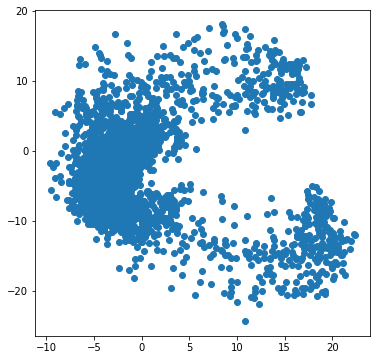

In [ ]:
target_arr_ = torch.from_numpy((target_arr/target_arr.max())[:, None, ...]).float()

try:
  if torch.cuda.is_available():
      ed.cuda()
      target_arr_ = target_arr_.cuda()
except RuntimeError:
  pass
   
with torch.no_grad():
    latent_features = ed.encoder(target_arr_).cpu()

plt.figure(figsize=(6, 6))
plt.scatter(latent_features[:,0], latent_features[:,1]);

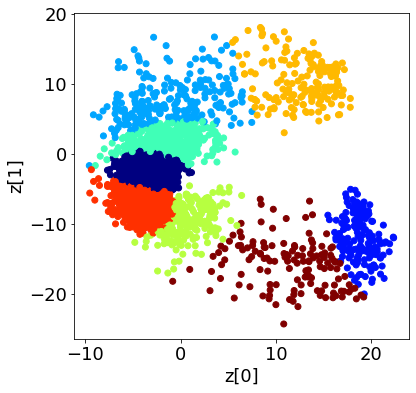

In [ ]:
gmmp = GaussianMixture(n_components=8, random_state=42)
gmm_zp = gmmp.fit_predict(latent_features)

plt.figure(figsize=(6,6))
plt.scatter(latent_features[:, 0], latent_features[:,1], c=gmm_zp, cmap="jet")
plt.xlabel("z[0]", fontsize = 18)
plt.ylabel("z[1]", fontsize = 18)
plt.tick_params(labelsize = 18)

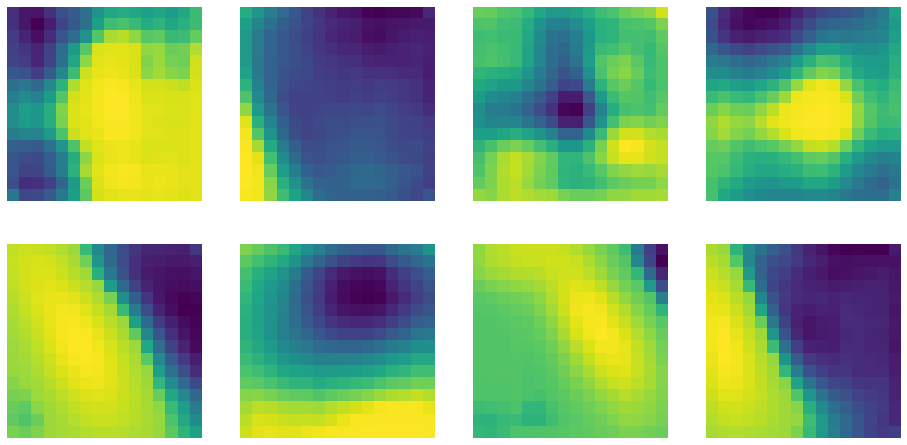

In [ ]:
ed.cpu()

nc = 8
gmmp = GaussianMixture(n_components=nc, random_state=42)
centroids = gmmp.fit(latent_features).means_

rows = int(np.ceil(float(nc)/4))
cols = int(np.ceil(float(nc)/rows))

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i, centroid in enumerate(centroids):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(torch.squeeze(
        ed.decoder(torch.from_numpy(centroid).float())).reshape(window_size, window_size).detach())
    #ax2.set_title('Component ' + str(i + 1))
    plt.tick_params(labelsize = 0)
    ax2.axis(False)
plt.show()

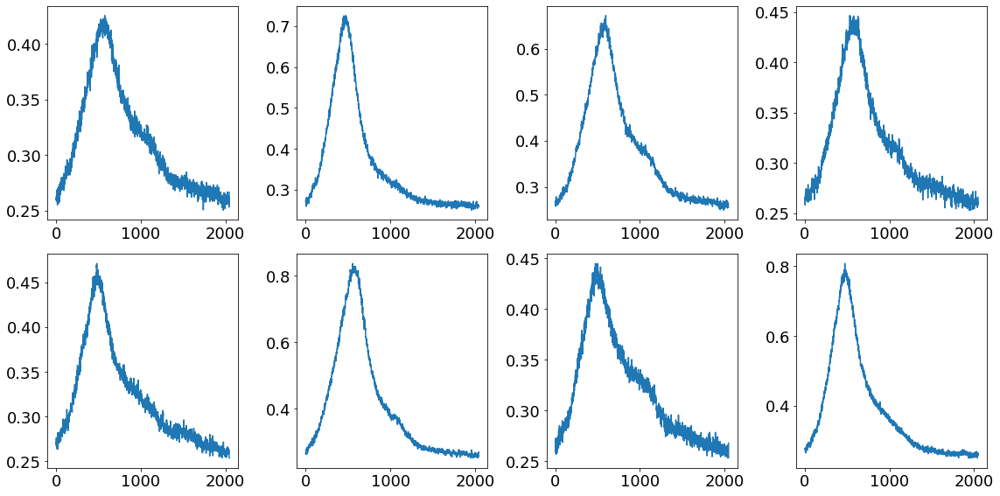

In [ ]:
rows = int(np.ceil(float(nc)/4))
cols = int(np.ceil(float(nc)/rows))

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i, centroid in enumerate(centroids):
    ax2 = fig2.add_subplot(gs2[i])

    comp_arr = []
    for n, feature in enumerate(latent_features.numpy()):
      comp = np.sum((feature[:]-np.squeeze(centroids[i]))**2)
      comp_arr = np.append(comp_arr, comp)

    loc_loop = (target_arr/target_arr.max())[np.argsort(comp_arr)[:10],:].mean(axis = 0)
    ax2.plot((target_arr/target_arr.max())[np.argsort(comp_arr)[:10],:].mean(axis = 0))
    # ax2.set_title('Component ' + str(i + 1))
    #plt.ylim((-11,10))
    plt.tick_params(labelsize = 18)
# plt.show()
plt.tight_layout()

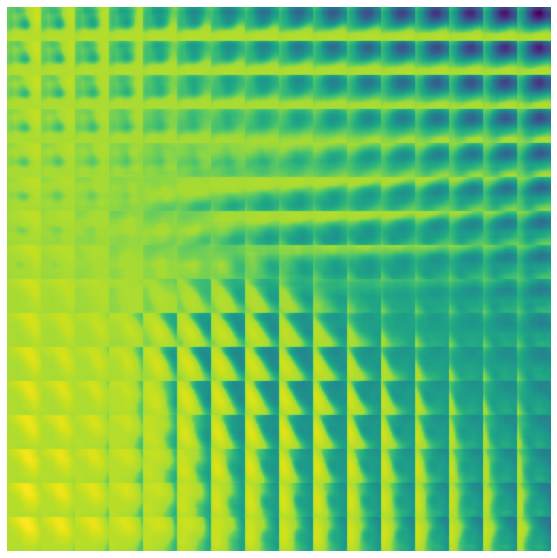

In [ ]:
if latent_features.shape[-1] != 2:
    raise ValueError("Your latent vector last dimension must be equal to 2")

xmin = latent_features[:, 0].min()
ymin = latent_features[:, 1].min()
xmax = latent_features[:, 0].max()
ymax = latent_features[:, 1].max()

n = 16
window_size1 = 16
window_size2 = 16
figure = np.zeros((window_size1 * n, window_size2 * n))

# linearly spaced coordinates corresponding to the 2D plot
# of spectrum classes in the latent space
grid_x = np.linspace(xmin, xmax, n)
grid_y = np.linspace(ymin, ymax, n)[::-1]
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        z = torch.Tensor([[xi, yi]])
        with torch.no_grad():
            x_decoded = ed.decoder(z)
        local_im = x_decoded[0].reshape(window_size, window_size)
        figure[i * window_size: (i + 1) * window_size,
                j * window_size: (j + 1) * window_size] = local_im

plt.figure(figsize=(10, 10))
start_range = window_size // 2
end_range = n * window_size + start_range + 1
pixel_range = np.arange(start_range, end_range, window_size)
sample_range_x = np.round(grid_x, 1)
sample_range_y = np.round(grid_y, 1)
#plt.xticks(pixel_range, sample_range_x)
#plt.yticks(pixel_range, sample_range_y)
plt.xlabel("z[0]")
plt.ylabel("z[1]")
# plt.imshow(figure, cmap='viridis', vmin=0, vmax=1.1)
plt.imshow(figure, cmap='viridis')
plt.axis("off")
plt.show()

In [ ]:
z.shape

torch.Size([1, 2])

In [ ]:
x_decoded.shape

torch.Size([1, 1, 16, 16])

## Spectrum 2D grid image possible?

* Trying to show the SPECTRUM 2D grid image... not sure it is possible though?

In [ ]:
if latent_features.shape[-1] != 2:
    raise ValueError("Your latent vector last dimension must be equal to 2")

xmin = latent_features[:, 0].min()
ymin = latent_features[:, 1].min()
xmax = latent_features[:, 0].max()
ymax = latent_features[:, 1].max()

n = 8
window_size1 = 8
window_size2 = 8
# figure = np.zeros((window_size1 * n, window_size2 * n))
gs = gridspec.GridSpec(window_size1, window_size2)
fig = plt.figure(figsize = (10,10))

spec_array = np.zeros((n, n, target_arr.shape[1]))

# linearly spaced coordinates corresponding to the 2D plot
# of spectrum classes in the latent space
grid_x = np.linspace(xmin, xmax, n)
grid_y = np.linspace(ymin, ymax, n)[::-1]
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        z = torch.Tensor([[xi, yi]])

        with torch.no_grad():
            x_decoded = ed.decoder(z)
        local_im = x_decoded[0].reshape(window_size, window_size)
        figure[i * window_size: (i + 1) * window_size,
                j * window_size: (j + 1) * window_size] = local_im

        # comp_arr = []
        # for n, feature in enumerate(latent_features):
        #   comp = torch.sum((feature[:]-np.squeeze(z))**2)
        #   comp_arr.append(comp)
        # loc_spec = target_arr[torch.argsort(torch.Tensor(comp_arr))[:3],:].mean(axis = 0)

        # ax = fig.add_subplot(gs[7-i,7-j])
        # ax.plot(reshaped_eaxis,loc_spec, c='k')
        # ax.set_ylim(0.2,0.75)  # Set common y limits to better compare

        # # More plotting details


        # # Keep only x ticks for bottom row
        # if i != 0:
        #   ax.axes.get_xaxis().set_ticks([])
        # else:
        #   pass
        # # Keep only y ticks for first column (they are all the same so it's fine to do this)
        # if j != 7:
        #   ax.axes.get_yaxis().set_ticks([])
        # else:
        #   pass
        
        # # x and y labels for the figure (I guess I could've just added to figure and not to the specific axis.. oh well)
        # if i==0 and j==4:
        #   ax.set_xlabel('Energy Loss (eV)')
        #   x0, y0 = 1.25, -0.5
        #   ax.xaxis.set_label_coords(x0, y0)

        # if i==3 and j==7:
        #   ax.set_ylabel('Intensity (a.u.)')
        #   x0, y0 = -0.75, 1.25
        #   ax.yaxis.set_label_coords(x0, y0)

        # # add to new array, can do PCA or something on it later... is that sensible?
        # spec_array[i,j] = loc_spec

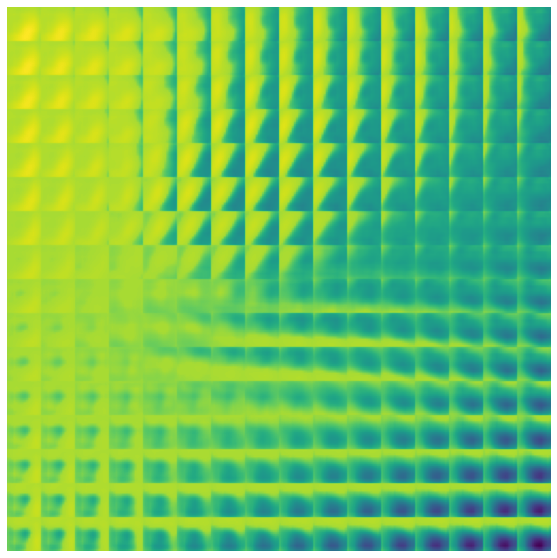

In [ ]:
plt.figure(figsize=(10, 10))
start_range = window_size // 2
end_range = n * window_size + start_range + 1
pixel_range = np.arange(start_range, end_range, window_size)
sample_range_x = np.round(grid_x, 1)
sample_range_y = np.round(grid_y, 1)
#plt.xticks(pixel_range, sample_range_x)
#plt.yticks(pixel_range, sample_range_y)
plt.xlabel("z[0]")
plt.ylabel("z[1]")
plt.imshow(figure, cmap='viridis', origin = 'lower')
#plt.imshow(figure, cmap='viridis')
plt.axis("off")
plt.show()

# MSE / correlation plots

* As a function of number of latent dimensions

In [ ]:
# SI2
%%capture

# im2spec
!gdown https://drive.google.com/uc?id=1SNkKa4iVTIWW47AG6OYVAlFwHCDnXWWD  # 2L
!gdown https://drive.google.com/uc?id=155eSKl1cY21_qpgZCjWTjjqrNPp2VjJu  # 3L
!gdown https://drive.google.com/uc?id=1HT2ud19X-4m1Y2NTszQrZZJK1nVoMH3I  # 4L
!gdown https://drive.google.com/uc?id=1MKzLsFRdu7QUlI5oexbeuVaUWThOQAoz  # 5L
!gdown https://drive.google.com/uc?id=1XXIOEa9BRFeatL5Cxs04mVQQ4JLbSkWG  # 6L
!gdown https://drive.google.com/uc?id=1eNpF6t5xIpIJtrGR-nzC1frZ5BRdwZNg  # 7L
!gdown https://drive.google.com/uc?id=1GNPhp-XV7AjG3haNaMyr2im_izXJ-cHs  # 8L
!gdown https://drive.google.com/uc?id=1wV1Cyik2npBjztwyJEkqJvBr9LGCeqCb  # 9L
!gdown https://drive.google.com/uc?id=1LXPy1C7rggautE7XLDbX-uLEmJKgZsar  # 10L
!gdown https://drive.google.com/uc?id=1609hy-DCa8_gJILuyA37bky-gOoNGpcj  # 15L
!gdown https://drive.google.com/uc?id=1h0a6IxYQGTx525LC7rxKZDNQ6TDE2NMJ  # 30L


# spec2im
!gdown https://drive.google.com/uc?id=1pARIfuLSyoVxsvjJqQCZI3kWIfxMoYE6  # 2L
!gdown https://drive.google.com/uc?id=15Pwm4K2n7db6VTtgauD4hkBt7maqaG45  # 3L
!gdown https://drive.google.com/uc?id=1T3PXV7tToeEhiaLss3TIhdyJlt5M12MP  # 4L
!gdown https://drive.google.com/uc?id=1uWUetsVI9rJ6Os3TuxHWQasTxs7E71rG  # 5L
!gdown https://drive.google.com/uc?id=1gsYqWQy5PamMuQbbBBUomjhcLQrRtEsA  # 6L
!gdown https://drive.google.com/uc?id=18C_Pur4wuvXZX5t6cbAdo6MqeZdd0Aq_  # 7L
!gdown https://drive.google.com/uc?id=11zIJsuqD_i83znUOiJWEAd0FiRZl0K5H  # 8L
!gdown https://drive.google.com/uc?id=1b8EUh044qiI597mbI6N9WLxTYjKwIp0K  # 9L
!gdown https://drive.google.com/uc?id=1s-yF4IgsQtwrY-KFEGzNTe1u4sp4gyDh  # 10L
!gdown https://drive.google.com/uc?id=1HttSgxtfBIGXWcZH4ph2NWS5DZ1wrEex  # 15L
!gdown https://drive.google.com/uc?id=1etZZhVkAIbmkLf-PRblcjORGGmp1N5zp  # 30L

# ADF 
!gdown https://drive.google.com/uc?id=1DcOHYpinGZ-Ovv4pI5BBPfVYB120j4Ja # ADF2

Load them into the notebook

In [ ]:
HAADF2 = np.load("ADF2_cropped.npy")

# SI 2

# im2spec
SI2_im2spec_error_2L_ = np.load("error_im2spec_SI2_2L_NO_NORM.npy")
SI2_im2spec_error_3L_ = np.load("error_im2spec_SI2_3L_NO_NORM.npy")
SI2_im2spec_error_4L_ = np.load("error_im2spec_SI2_4L_NO_NORM.npy")
SI2_im2spec_error_5L_ = np.load("error_im2spec_SI2_5L_NO_NORM.npy")
SI2_im2spec_error_6L_ = np.load("error_im2spec_SI2_6L_NO_NORM.npy")
SI2_im2spec_error_7L_ = np.load("error_im2spec_SI2_7L_NO_NORM.npy")
SI2_im2spec_error_8L_ = np.load("error_im2spec_SI2_8L_NO_NORM.npy")
SI2_im2spec_error_9L_ = np.load("error_im2spec_SI2_9L_NO_NORM.npy")
SI2_im2spec_error_10L_ = np.load("error_im2spec_SI2_10L_NO_NORM.npy")
SI2_im2spec_error_15L_ = np.load("error_im2spec_SI2_15L_NO_NORM.npy")
SI2_im2spec_error_30L_ = np.load("error_im2spec_SI2_30L_NO_NORM.npy")

# spec2im
SI2_spec2im_error_2L_ = np.load("error_spec2im_SI2_2L_NO_NORM.npy")
SI2_spec2im_error_3L_ = np.load("error_spec2im_SI2_3L_NO_NORM.npy")
SI2_spec2im_error_4L_ = np.load("error_spec2im_SI2_4L_NO_NORM.npy")
SI2_spec2im_error_5L_ = np.load("error_spec2im_SI2_5L_NO_NORM.npy")
SI2_spec2im_error_6L_ = np.load("error_spec2im_SI2_6L_NO_NORM.npy")
SI2_spec2im_error_7L_ = np.load("error_spec2im_SI2_7L_NO_NORM.npy")
SI2_spec2im_error_8L_ = np.load("error_spec2im_SI2_8L_NO_NORM.npy")
SI2_spec2im_error_9L_ = np.load("error_spec2im_SI2_9L_NO_NORM.npy")
SI2_spec2im_error_10L_ = np.load("error_spec2im_SI2_10L_NO_NORM.npy")
SI2_spec2im_error_15L_ = np.load("error_spec2im_SI2_15L_NO_NORM.npy")
SI2_spec2im_error_30L_ = np.load("error_spec2im_SI2_30L_NO_NORM.npy")

Normalize all [0,1]

In [ ]:
# NORMALIZE!!! for SI 2

# im2spec
SI2_im2spec_error_2L = (SI2_im2spec_error_2L_ - np.min(SI2_im2spec_error_2L_))/np.ptp(SI2_im2spec_error_2L_)
SI2_im2spec_error_3L = (SI2_im2spec_error_3L_ - np.min(SI2_im2spec_error_3L_))/np.ptp(SI2_im2spec_error_3L_)
SI2_im2spec_error_4L = (SI2_im2spec_error_4L_ - np.min(SI2_im2spec_error_4L_))/np.ptp(SI2_im2spec_error_4L_)
SI2_im2spec_error_5L = (SI2_im2spec_error_5L_ - np.min(SI2_im2spec_error_5L_))/np.ptp(SI2_im2spec_error_5L_)
SI2_im2spec_error_6L = (SI2_im2spec_error_6L_ - np.min(SI2_im2spec_error_6L_))/np.ptp(SI2_im2spec_error_6L_)
SI2_im2spec_error_7L = (SI2_im2spec_error_7L_ - np.min(SI2_im2spec_error_7L_))/np.ptp(SI2_im2spec_error_7L_)
SI2_im2spec_error_8L = (SI2_im2spec_error_8L_ - np.min(SI2_im2spec_error_8L_))/np.ptp(SI2_im2spec_error_8L_)
SI2_im2spec_error_9L = (SI2_im2spec_error_9L_ - np.min(SI2_im2spec_error_9L_))/np.ptp(SI2_im2spec_error_9L_)
SI2_im2spec_error_10L = (SI2_im2spec_error_10L_ - np.min(SI2_im2spec_error_10L_))/np.ptp(SI2_im2spec_error_10L_)
SI2_im2spec_error_15L = (SI2_im2spec_error_15L_ - np.min(SI2_im2spec_error_15L_))/np.ptp(SI2_im2spec_error_15L_)
SI2_im2spec_error_30L = (SI2_im2spec_error_30L_ - np.min(SI2_im2spec_error_30L_))/np.ptp(SI2_im2spec_error_30L_)

# spec2im
SI2_spec2im_error_2L = (SI2_spec2im_error_2L_ - np.min(SI2_spec2im_error_2L_))/np.ptp(SI2_spec2im_error_2L_)
SI2_spec2im_error_3L = (SI2_spec2im_error_3L_ - np.min(SI2_spec2im_error_3L_))/np.ptp(SI2_spec2im_error_3L_)
SI2_spec2im_error_4L = (SI2_spec2im_error_4L_ - np.min(SI2_spec2im_error_4L_))/np.ptp(SI2_spec2im_error_4L_)
SI2_spec2im_error_5L = (SI2_spec2im_error_5L_ - np.min(SI2_spec2im_error_5L_))/np.ptp(SI2_spec2im_error_5L_)
SI2_spec2im_error_6L = (SI2_spec2im_error_6L_ - np.min(SI2_spec2im_error_6L_))/np.ptp(SI2_spec2im_error_6L_)
SI2_spec2im_error_7L = (SI2_spec2im_error_7L_ - np.min(SI2_spec2im_error_7L_))/np.ptp(SI2_spec2im_error_7L_)
SI2_spec2im_error_8L = (SI2_spec2im_error_8L_ - np.min(SI2_spec2im_error_8L_))/np.ptp(SI2_spec2im_error_8L_)
SI2_spec2im_error_9L = (SI2_spec2im_error_9L_ - np.min(SI2_spec2im_error_9L_))/np.ptp(SI2_spec2im_error_9L_)
SI2_spec2im_error_10L = (SI2_spec2im_error_10L_ - np.min(SI2_spec2im_error_10L_))/np.ptp(SI2_spec2im_error_10L_)
SI2_spec2im_error_15L = (SI2_spec2im_error_15L_ - np.min(SI2_spec2im_error_15L_))/np.ptp(SI2_spec2im_error_15L_)
SI2_spec2im_error_30L = (SI2_spec2im_error_30L_ - np.min(SI2_spec2im_error_30L_))/np.ptp(SI2_spec2im_error_30L_)

In [ ]:
from skimage.metrics import mean_squared_error as MSE

* Calculate MSE first:

In [ ]:
# im2spec

MSE_im2spec_SI2_2L = MSE(HAADF2, SI2_im2spec_error_2L)
MSE_im2spec_SI2_3L = MSE(HAADF2, SI2_im2spec_error_3L)
MSE_im2spec_SI2_4L = MSE(HAADF2, SI2_im2spec_error_4L)
MSE_im2spec_SI2_5L = MSE(HAADF2, SI2_im2spec_error_5L)
MSE_im2spec_SI2_6L = MSE(HAADF2, SI2_im2spec_error_6L)
MSE_im2spec_SI2_7L = MSE(HAADF2, SI2_im2spec_error_7L)
MSE_im2spec_SI2_8L = MSE(HAADF2, SI2_im2spec_error_8L)
MSE_im2spec_SI2_9L = MSE(HAADF2, SI2_im2spec_error_9L)
MSE_im2spec_SI2_10L = MSE(HAADF2, SI2_im2spec_error_10L)
MSE_im2spec_SI2_15L = MSE(HAADF2, SI2_im2spec_error_15L)
MSE_im2spec_SI2_30L = MSE(HAADF2, SI2_im2spec_error_30L)

# spec2im

MSE_spec2im_SI2_2L = MSE(HAADF2, SI2_spec2im_error_2L)
MSE_spec2im_SI2_3L = MSE(HAADF2, SI2_spec2im_error_3L)
MSE_spec2im_SI2_4L = MSE(HAADF2, SI2_spec2im_error_4L)
MSE_spec2im_SI2_5L = MSE(HAADF2, SI2_spec2im_error_5L)
MSE_spec2im_SI2_6L = MSE(HAADF2, SI2_spec2im_error_6L)
MSE_spec2im_SI2_7L = MSE(HAADF2, SI2_spec2im_error_7L)
MSE_spec2im_SI2_8L = MSE(HAADF2, SI2_spec2im_error_8L)
MSE_spec2im_SI2_9L = MSE(HAADF2, SI2_spec2im_error_9L)
MSE_spec2im_SI2_10L = MSE(HAADF2, SI2_spec2im_error_10L)
MSE_spec2im_SI2_15L = MSE(HAADF2, SI2_spec2im_error_15L)
MSE_spec2im_SI2_30L = MSE(HAADF2, SI2_spec2im_error_30L)

* Then correlation coefficient

In [ ]:
# correlation coefficient test:

# im2spec #

cor_im2spec_SI2_2L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_2L.reshape(-1))[0][1]
cor_im2spec_SI2_3L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_3L.reshape(-1))[0][1]
cor_im2spec_SI2_4L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_4L.reshape(-1))[0][1]
cor_im2spec_SI2_5L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_5L.reshape(-1))[0][1]
cor_im2spec_SI2_6L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_6L.reshape(-1))[0][1]
cor_im2spec_SI2_7L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_7L.reshape(-1))[0][1]
cor_im2spec_SI2_8L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_8L.reshape(-1))[0][1]
cor_im2spec_SI2_9L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_9L.reshape(-1))[0][1]
cor_im2spec_SI2_10L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_10L.reshape(-1))[0][1]
cor_im2spec_SI2_15L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_15L.reshape(-1))[0][1]
cor_im2spec_SI2_30L = np.corrcoef(HAADF2.reshape(-1), SI2_im2spec_error_30L.reshape(-1))[0][1]

# spec2im #

cor_spec2im_SI2_2L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_2L.reshape(-1))[0][1]
cor_spec2im_SI2_3L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_3L.reshape(-1))[0][1]
cor_spec2im_SI2_4L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_4L.reshape(-1))[0][1]
cor_spec2im_SI2_5L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_5L.reshape(-1))[0][1]
cor_spec2im_SI2_6L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_6L.reshape(-1))[0][1]
cor_spec2im_SI2_7L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_7L.reshape(-1))[0][1]
cor_spec2im_SI2_8L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_8L.reshape(-1))[0][1]
cor_spec2im_SI2_9L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_9L.reshape(-1))[0][1]
cor_spec2im_SI2_10L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_10L.reshape(-1))[0][1]
cor_spec2im_SI2_15L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_15L.reshape(-1))[0][1]
cor_spec2im_SI2_30L = np.corrcoef(HAADF2.reshape(-1), SI2_spec2im_error_30L.reshape(-1))[0][1]



* Put it all together:

In [ ]:
# Group all correlation coefficients
correlations_SI2_im2spec = np.array([cor_im2spec_SI2_2L,cor_im2spec_SI2_3L,cor_im2spec_SI2_4L,cor_im2spec_SI2_5L,cor_im2spec_SI2_6L,
                                     cor_im2spec_SI2_7L,cor_im2spec_SI2_8L,cor_im2spec_SI2_9L,cor_im2spec_SI2_10L,cor_im2spec_SI2_15L,
                                     cor_im2spec_SI2_30L])
correlations_SI2_spec2im = np.array([cor_spec2im_SI2_2L,cor_spec2im_SI2_3L,cor_spec2im_SI2_4L,cor_spec2im_SI2_5L,cor_spec2im_SI2_6L,
                                     cor_spec2im_SI2_7L,cor_spec2im_SI2_8L,cor_spec2im_SI2_9L,cor_spec2im_SI2_10L,cor_spec2im_SI2_15L,
                                     cor_spec2im_SI2_30L])

# Group all MSEs
MSEall_SI2_im2spec = np.array([MSE_im2spec_SI2_2L,MSE_im2spec_SI2_3L,MSE_im2spec_SI2_4L,MSE_im2spec_SI2_5L,MSE_im2spec_SI2_6L,
                                     MSE_im2spec_SI2_7L,MSE_im2spec_SI2_8L,MSE_im2spec_SI2_9L,MSE_im2spec_SI2_10L,MSE_im2spec_SI2_15L,
                                     MSE_im2spec_SI2_30L])
MSEall_SI2_spec2im = np.array([MSE_spec2im_SI2_2L,MSE_spec2im_SI2_3L,MSE_spec2im_SI2_4L,MSE_spec2im_SI2_5L,MSE_spec2im_SI2_6L,
                                     MSE_spec2im_SI2_7L,MSE_spec2im_SI2_8L,MSE_spec2im_SI2_9L,MSE_spec2im_SI2_10L,MSE_spec2im_SI2_15L,
                                     MSE_spec2im_SI2_30L])

Plot them

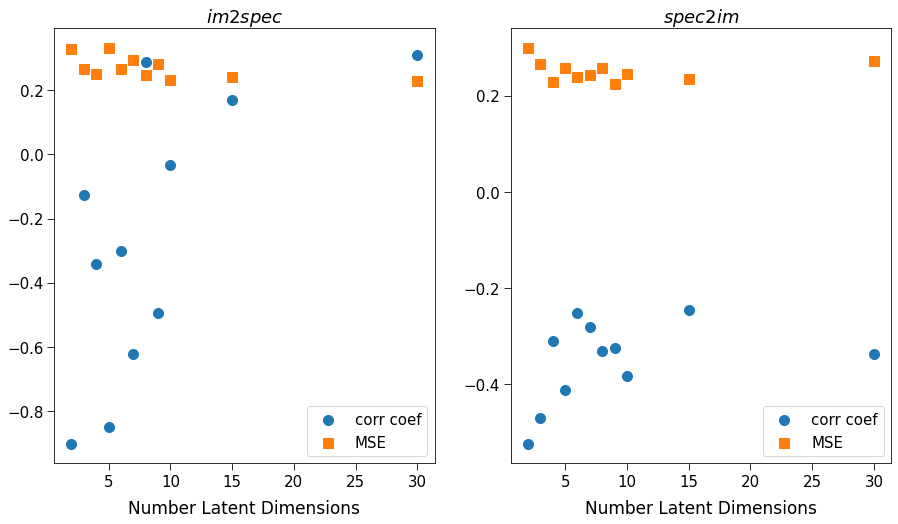

In [ ]:
# Two plots:
# 1) MSE and correlation on SAME plot but im2spec ONLY
# 2) MSE and correlation on SAME plot but spec2im ONLY 

# Set up x-axis
Xlatent = [2,3,4,5,6,7,8,9,10,15,30]

f,a = plt.subplots(1,2,figsize=(15,8))
a[0].scatter(Xlatent, correlations_SI2_im2spec, marker = "o", label = "corr coef", s=100)
a[0].scatter(Xlatent, MSEall_SI2_im2spec, marker = "s", label = 'MSE', s=100)

a[1].scatter(Xlatent, correlations_SI2_spec2im, marker='o', label = 'corr coef', s = 100)
a[1].scatter(Xlatent, MSEall_SI2_spec2im, marker='s', label = 'MSE', s=100)


# plot settings

# plt.suptitle('im2spec', style='italic', fontsize = 18)

a[0].legend(fontsize = 15)
a[1].legend(fontsize = 15)

a[0].set_xlabel('Number Latent Dimensions', fontsize = 17, labelpad = 10)
a[1].set_xlabel('Number Latent Dimensions', fontsize = 17, labelpad = 10)

a[0].tick_params(length=7, labelsize = 15)
a[1].tick_params(length=7, labelsize = 15)

a[0].set_title('$im2spec$', fontsize = 18)
a[1].set_title('$spec2im$', fontsize = 18);